In [ ]:
# import os
# os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
# Helpful statement for debugging, prints the thing entered as x and the output, i.e.,
# debugPrint(1+1) will output '1+1 [int] = 2'
import inspect
import re
def debugPrint(x):
    frame = inspect.currentframe().f_back
    s = inspect.getframeinfo(frame).code_context[0]
    r = re.search(r"\((.*)\)", s).group(1)
    print("{} [{}] = {}".format(r,type(x).__name__, x))
    
    
import os
import os, sys
# sys.path.append(os.path.join('~/dev/pytorchSPH/', "lib"))
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from tqdm.notebook import trange, tqdm
import yaml
%matplotlib widget
import warnings
warnings.filterwarnings(action='once')
from datetime import datetime

import torch
from torch_geometric.nn import radius
from torch_geometric.nn import SplineConv, fps, global_mean_pool, radius_graph, radius
from torch_scatter import scatter

from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import tomli
from scipy.optimize import minimize
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mticker

import torch
# import torchvision.models as models
from torch.profiler import profile, record_function, ProfilerActivity
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 
from tqdm import TqdmExperimentalWarning

warnings.filterwarnings("ignore", category=TqdmExperimentalWarning)

In [ ]:
import diffSPH

In [ ]:
import seaborn as sns
from diffSPH.util import evalArea
from diffSPH.noise.generator import generatePerlin, generateSimplex, generateOctaveNoise
from scipy import interpolate
from diffSPH.modules.neighborSearch import radiusCompactHashMap, periodicNeighborSearch
from diffSPH.util import scatter_sum
from diffSPH.kernels import *
from diffSPH.randomParticles import generatePeriodicRandomParticles

Cuda compiler: /home/winchenbach/anaconda3/envs/torch2


In [ ]:

from diffSPH.modules.neighborSearch import periodicNeighborSearchXY
from diffSPH.kernels import getKernel


In [ ]:
Kernel = getKernel('Wendland2')

In [ ]:
from diffSPH.v2.sampling import sampleRegular
from diffSPH.v2.math import volumeToSupport

dim = 1
targetNeighbors = 50


periodicity = [True * dim]
minDomain = [-1] * dim
maxDomain = [ 1] * dim
nx = 32

positions = sampleRegular(nx, minDomain, maxDomain)
area = ((maxDomain[0] - minDomain[0])/ nx)**dim
support = volumeToSupport(area, targetNeighbors, dim)


x = positions
# print(positions.shape)
areas = torch.ones(x.shape[0]) * area
supports = torch.ones(x.shape[0]) * support

print('area:', area, area * nx**dim)

if minDomain is not None and isinstance(minDomain, list):
    minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
else:
    minD = minDomain
if maxDomain is not None and isinstance(minDomain, list):
    maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)
else:
    maxD = maxDomain

area: 0.0625 2.0


In [ ]:
from diffSPH.v2.neighborhood import neighborSearch, radiusNaive

In [ ]:
import timeit
import numpy as np

def testRadius(dim, nx, targetNeighbors, periodic):
    overallStart = timeit.default_timer()
    generationStart = timeit.default_timer()
    # dim = 1
    targetNeighbors = 50


    periodicity = [periodic * dim]
    minDomain = [-1] * dim
    maxDomain = [ 1] * dim

    positions = sampleRegular(nx, minDomain, maxDomain)
    area = ((maxDomain[0] - minDomain[0])/ nx)**dim
    support = volumeToSupport(area, targetNeighbors, dim)


    x = positions
    supports = torch.ones(x.shape[0]) * support

    # print('area:', area, area * nx**dim)

    if minDomain is not None and isinstance(minDomain, list):
        minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
    else:
        minD = minDomain
    if maxDomain is not None and isinstance(minDomain, list):
        maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)
    else:
        maxD = maxDomain

    generationEnd = timeit.default_timer()
    searchStart = timeit.default_timer()
    i, j, rij, xij, hij = radiusNaive(x, x, supports, supports, periodic = periodicity, minDomain = minD, maxDomain = maxD, mode ='gather')
    # print(i.shape, j.shape, rij.shape, xij.shape, hij.shape)
    searchEnd = timeit.default_timer()
    overallEnd = timeit.default_timer()
    return overallEnd - overallStart, generationEnd - generationStart, searchEnd - searchStart

testRadius(1, 32, 50, True)

(0.018965776020195335, 0.0014722039923071861, 0.017491854028776288)

In [ ]:
import pandas as pd

In [ ]:
measurements = 32
dim = 1
targetNeighbors = 50
periodic = True
nxs = [32, 64, 128, 256, 512, 1024, 2048, 4096, 8192, 16384]
times = []

dataset = pd.DataFrame(columns = ['nx', 'overall', 'generation', 'search', 'periodic', 'dim', 'targetNeighbors'])

for nx in tqdm(nxs):
    for i in tqdm(range(measurements), leave = False):
        overall, generation, search = testRadius(1, nx, 50, True)
        current = pd.DataFrame({'nx': nx, 'overall': overall, 'generation': generation, 'search': search, 'periodic': True, 'dim': 1, 'targetNeighbors': 50}, index = [0])
        dataset = pd.concat((dataset, current), ignore_index = True)

display(dataset)


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

/tmp/ipykernel_189578/309188547.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dataset = pd.concat((dataset, current), ignore_index = True)


  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

  0%|          | 0/32 [00:00<?, ?it/s]

,nx,overall,generation,search,periodic,dim,targetNeighbors
0,32,0.000897,0.000478,0.000418,True,1,50
1,32,0.000738,0.000354,0.000384,True,1,50
2,32,0.000513,0.000189,0.000323,True,1,50
3,32,0.000495,0.000178,0.000317,True,1,50
4,32,0.000465,0.000166,0.000299,True,1,50
...,...,...,...,...,...,...,...
315,16384,1.775502,0.001093,1.774408,True,1,50
316,16384,1.783320,0.000684,1.782635,True,1,50
317,16384,1.804007,0.000600,1.803405,True,1,50
318,16384,1.877988,0.000819,1.877168,True,1,50


a: 1.2991577709376479e-08 b: 1.9306572531657067


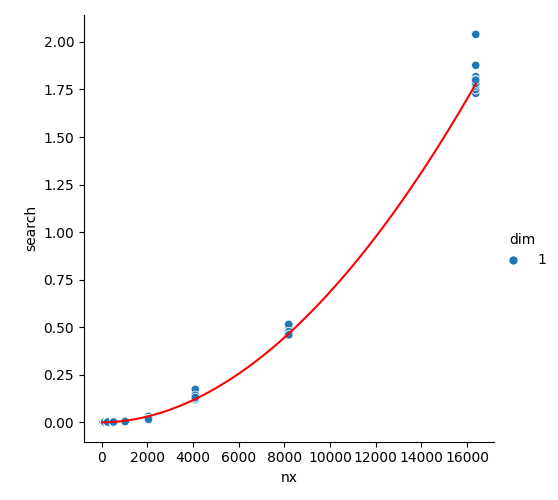

In [ ]:
import copy
import seaborn as sns
from scipy.optimize import curve_fit

c = copy.deepcopy(dataset)

c['nx'] = c['nx'].astype('float32')
c['overall'] = (c['overall']).astype('float32')
c['generation'] = (c['generation']).astype('float32')
c['search'] = (c['search']).astype('float32')

def func(x, a, b):
    return a * x**b
# Extract the data from the dataset
x = dataset['nx']
y = dataset['search']

# Fit the curve to the data
popt, pcov = curve_fit(func, x, y)

# Get the fitted parameters
a_fit = popt[0]
b_fit = popt[1]

g = sns.relplot(data=c, x='nx', y='search', hue='dim')
g.ax.plot(np.linspace(c['nx'].min(), c['nx'].max(), 64), func(np.linspace(c['nx'].min(), c['nx'].max(), 64), a_fit, b_fit), 'r-', label='Fit: {:.2f} * x^({:.2f})'.format(a_fit, b_fit))
# g.ax.legend()

print('a:', a_fit, 'b:', b_fit)



In [ ]:
measurements = 4
dim = 2
targetNeighbors = 50
periodic = True
nxs = np.logspace(3, 7, 16, base = 2, dtype = int)
times = []

dataset2D = pd.DataFrame(columns = ['nx', 'overall', 'generation', 'search', 'periodic', 'dim', 'targetNeighbors'])
print(nxs)
for nx in tqdm(nxs):
    for i in range(measurements):
        overall, generation, search = testRadius(dim, nx, 50, True)
        current = pd.DataFrame({'nx': nx, 'overall': overall, 'generation': generation, 'search': search, 'periodic': True, 'dim': dim, 'targetNeighbors': 50}, index = [0])
        dataset2D = pd.concat((dataset2D, current), ignore_index = True)

display(dataset2D)


[  8   9  11  13  16  20  24  29  35  42  50  61  73  88 106 128]


  0%|          | 0/16 [00:00<?, ?it/s]

/tmp/ipykernel_191457/1219846631.py:14: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  dataset2D = pd.concat((dataset2D, current), ignore_index = True)


,nx,overall,generation,search,periodic,dim,targetNeighbors
0,8,0.019762,0.001700,0.018061,True,2,50
1,8,0.003746,0.000568,0.003177,True,2,50
2,8,0.000855,0.000354,0.000500,True,2,50
3,8,0.000743,0.000259,0.000483,True,2,50
4,9,0.001102,0.000245,0.000857,True,2,50
...,...,...,...,...,...,...,...
59,106,1.055966,0.000455,1.055510,True,2,50
60,128,2.130961,0.000509,2.130450,True,2,50
61,128,2.146717,0.000487,2.146229,True,2,50
62,128,2.157281,0.000478,2.156802,True,2,50


a: 2.2188858255844358e-08 b: 3.791656622212129


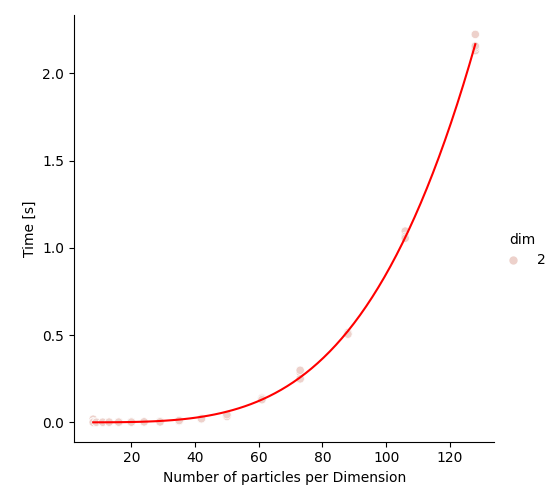

In [ ]:
import copy
import seaborn as sns
from scipy.optimize import curve_fit

c = copy.deepcopy(dataset2D)

c['nx'] = c['nx'].astype('float32')
c['overall'] = (c['overall']).astype('float32')
c['generation'] = (c['generation']).astype('float32')
c['search'] = (c['search']).astype('float32')

def func(x, a, b):
    return a * x**b
# Extract the data from the dataset
x = dataset2D['nx']
y = dataset2D['search']

# Fit the curve to the data
popt, pcov = curve_fit(func, x, y)

# Get the fitted parameters
a_fit = popt[0]
b_fit = popt[1]

g = sns.relplot(data=c, x='nx', y='search', hue='dim')
g.ax.plot(np.linspace(c['nx'].min(), c['nx'].max(), 64), func(np.linspace(c['nx'].min(), c['nx'].max(), 64), a_fit, b_fit), 'r-', label='Fit: {:.2f} * x^({:.2f})'.format(a_fit, b_fit))
# g.ax.legend()

g.ax.set_xlabel('Number of particles per Dimension')
g.ax.set_ylabel('Time [s]')

print('a:', a_fit, 'b:', b_fit)



In [ ]:
from diffSPH.modules.neighborSearch import radiusCompactHashMap, periodicNeighborSearch

from torch.utils.cpp_extension import load

neighborSearch = load(name="neighborSearch", 
    sources=[os.path.join('./src/diffSPH/cppSrc', "neighSearch.cpp"), os.path.join('./src/diffSPH/cppSrc', "neighSearch_cuda.cu")], 
    verbose=False, extra_cflags=['-fopenmp', '-O3', '-march=native', '-DCUDA_VERSION'])


In [ ]:
@torch.jit.script
def sortPositions(queryParticles, querySupport, supportScale :float = 1.0, qMin : Optional[torch.Tensor]  = None, qMax : Optional[torch.Tensor]  = None):
    with record_function("sort"): 
        with record_function("sort - bound Calculation"): 
            hMax = torch.max(querySupport)
            if qMin is None:
                qMin = torch.min(queryParticles,dim=0)[0] - hMax * supportScale
            else:
                qMin = qMin  - hMax * supportScale
            if qMax is None:
                qMax = torch.max(queryParticles,dim=0)[0] + 2 * hMax * supportScale
            else:
                qMax = qMax + 2 * hMax * supportScale
        with record_function("sort - index Calculation"): 
            qExtent = qMax - qMin
            cellCount = torch.ceil(qExtent / (hMax * supportScale)).to(torch.int32)
            indices = torch.ceil((queryParticles - qMin) / hMax).to(torch.int32)
            linearIndices = indices[:,0] + cellCount[0] * indices[:,1]
        with record_function("sort - actual argsort"): 
            sortingIndices = torch.argsort(linearIndices)
        with record_function("sort - sorting data"): 
            sortedLinearIndices = linearIndices[sortingIndices]
            sortedPositions = queryParticles[sortingIndices,:]
            sortedSupport = querySupport[sortingIndices]
    return sortedPositions, sortedSupport, sortedLinearIndices, sortingIndices, \


            int(cellCount[0]), qMin, float(hMax)

0.01220703125

In [ ]:
torch.min(positions, dim = 0)[0]

tensor([0.0005, 0.0004])

In [ ]:
from typing import Optional

@torch.jit.script
def getDomainExtents(positions, minDomain : Optional[torch.Tensor], maxDomain : Optional[torch.Tensor]):
    if minDomain is not None and isinstance(minDomain, list):
        minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
    elif minDomain is not None:
        minD = minDomain
    else:
        minD = torch.min(positions, dim = 0)[0]
    if maxDomain is not None and isinstance(minDomain, list):
        maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)
    elif maxDomain is not None:
        maxD = maxDomain
    else:
        maxD = torch.max(positions, dim = 0)[0]
    return minD, maxD

In [ ]:
import math

@torch.jit.script
def compute_h(qMin, qMax, referenceSupport : float):
    qExtent = qMax - qMin
    numCells = torch.ceil(qExtent / referenceSupport)
    h = qExtent / numCells
    return torch.max(torch.ceil(h / referenceSupport) * referenceSupport)


@torch.jit.script
def sortReferenceParticles(referenceParticles, referenceSupport : float, domainMin, domainMax):
    with record_function("sort"): 
        qMin = domainMin# - referenceSupport / 2
        qMax = domainMax# + referenceSupport / 2
        with record_function("sort - index Calculation"): 
            hCell = compute_h(qMin, qMax, referenceSupport)


            qExtent = qMax - qMin
            cellCount = torch.ceil(qExtent / (hCell)).to(torch.int32)
            indices = torch.ceil((referenceParticles - qMin) / hCell).to(torch.int32)
            linearIndices = indices[:,0] + cellCount[0] * indices[:,1]
        with record_function("sort - actual argsort"): 
            sortingIndices = torch.argsort(linearIndices)
        with record_function("sort - sorting data"): 
            sortedLinearIndices = linearIndices[sortingIndices]
            # sortedPositions = referenceParticles[sortingIndices,:]
            # sortedSupport = referenceSupport[sortingIndices]
    return sortedLinearIndices, sortingIndices, \
            int(cellCount[0]), qMin, qMax, float(hCell)


n = 1024
h = 0.1

positions = torch.rand(n, 2) * 0.5 + 0.25
dx = 1 / 32
xpos = torch.linspace(0 + dx / 2, 1 - dx / 2, 32)
ypos = torch.linspace(0 + dx / 2, 1 - dx / 2, 32)
xpos, ypos = torch.meshgrid(xpos, ypos)
positions = torch.stack((xpos.flatten(), ypos.flatten()), dim = 1)

supports = torch.ones(n) * h
minDomain = torch.tensor([0, 0])
maxDomain = torch.tensor([1, 1])
periodicity = [True] * positions.shape[1]

# positions[:,0] += 0.5

pos = []
for i, periodic in enumerate(periodicity):
    if periodic:
        pos.append(torch.remainder(positions[:,i] - minDomain[i], maxDomain[i] - minDomain[i]) + minDomain[i])
    else:
        pos.append(positions[:,i])
x = torch.stack(pos, dim = 1)

minD, maxD = getDomainExtents(x, minDomain, maxDomain)

sortedLinear, sortIndex, numCells, qMin, qMax, hCell = sortReferenceParticles(x, 0.1, minD, maxD)
sortedPositions = x[sortIndex,:]
sortedSupport = supports[sortIndex]

print(positions.shape)
print(positions[:,1])
print(numCells)

torch.Size([1024, 2])
tensor([0.0156, 0.0469, 0.0781,  ..., 0.9219, 0.9531, 0.9844])
10


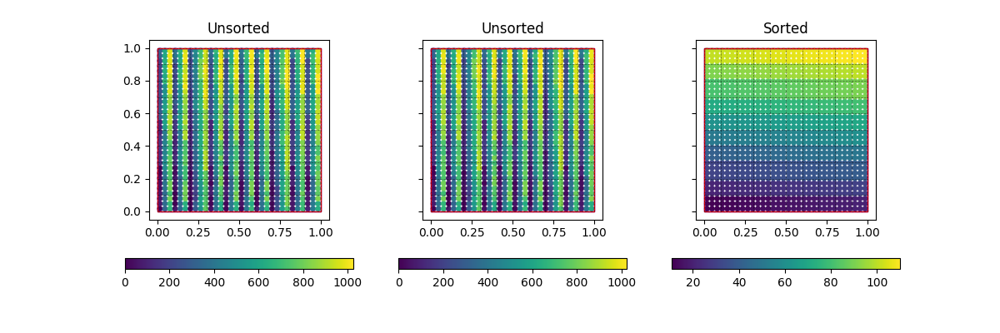

In [ ]:
fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = True, sharey = True, squeeze = False)

for i in range(numCells + 1):
    for ii in range(3):
        axis[0,ii].vlines(x = qMin[0] + i * hCell, ymin = qMin[0], ymax = qMax[0], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)
        axis[0,ii].hlines(y = qMin[1] + i * hCell, xmin = qMin[1], xmax = qMax[1], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)

scatterSize = 500 / math.sqrt(x.shape[0])

sc = axis[0,0].scatter(positions[:,0], positions[:,1], c = sortIndex, s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,0], orientation='horizontal')
axis[0,0].set_title('Unsorted')
axis[0,0].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,0].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,0].set_aspect(1, adjustable='box')

sc = axis[0,1].scatter(x[:,0], x[:,1], c = sortIndex, s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,1], orientation='horizontal')
axis[0,1].set_title('Unsorted')
axis[0,1].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,1].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,1].set_aspect(1, adjustable='box')

sc = axis[0,2].scatter(sortedPositions[:,0], sortedPositions[:,1], s = scatterSize, c = sortedLinear, label = 'Sorted')
fig.colorbar(sc, ax = axis[0,2], orientation='horizontal')
axis[0,2].set_title('Sorted')
axis[0,2].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,2].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,2].set_aspect(1, adjustable='box')



In [ ]:
sortedIndices = torch.ceil((sortedPositions - qMin) / hCell).to(torch.int32)

cellIndices, cellCounters = torch.unique_consecutive(sortedLinear, return_counts=True, return_inverse=False)
cellCounters = cellCounters.to(torch.int32)
cumCell = torch.hstack((torch.tensor([0], device = cellIndices.device, dtype=cellCounters.dtype),torch.cumsum(cellCounters,dim=0)))[:-1]#.to(torch.int32)
cellGridIndices = sortedIndices[cumCell,:]


print('cellIndices:', cellIndices.shape, 'cellCounters:', cellCounters.shape, 'cumCell:', cumCell.shape)
print('cellIndices:', cellIndices)
print('cellCounters:', cellCounters)
print('cumCell:', cumCell)
print('cellGridIndices', cellGridIndices)

cellIndices: torch.Size([100]) cellCounters: torch.Size([100]) cumCell: torch.Size([100])
cellIndices: tensor([ 11,  12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
         25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
         53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,  66,
         67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,
         81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,
         95,  96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
        109, 110], dtype=torch.int32)
cellCounters: tensor([ 9,  9, 12,  9,  9,  9,  9, 12,  9,  9,  9,  9, 12,  9,  9,  9,  9, 12,
         9,  9, 12, 12, 16, 12, 12, 12, 12, 16, 12, 12,  9,  9, 12,  9,  9,  9,
         9, 12,  9,  9,  9,  9, 12,  9,  9,  9,  9, 12,  9,  9,  9,  9, 12,  9,
         9,  9,  9, 12,  9,  9,  9,  9, 12,  9,  9,  9,  9,

In [ ]:
print('y', y.shape)
print('ySupport', ySupport.shape)
print('sortedPositions', sortedPositions.shape)
print('sortedSupport', sortedSupport.shape)
print('hashTable', hashTable.shape)
print('cellIndices', cellIndices.shape)
print('cumCell', cumCell.shape)
print('cellCounters', cellCounters.shape)
print('sortedIndices', sortedIndices.shape)
print('numCells', numCells)
print('hashMapLength', hashMapLength)
print('qMin', qMin)
print('hCell', hCell)
# print('i', i.shape)

y torch.Size([1024, 2])
ySupport torch.Size([1024])
sortedPositions torch.Size([1024, 2])
sortedSupport torch.Size([1024])
hashTable torch.Size([4096, 2])
cellIndices torch.Size([100])
cumCell torch.Size([100])
cellCounters torch.Size([100])
sortedIndices torch.Size([1024, 2])
numCells 10
hashMapLength 4096
qMin tensor([0, 0])
hCell 0.10000000149011612


In [ ]:
@torch.jit.script
def hashCellIndices(cellIndices, hashMapLength : int):
    primes = [73856093, 19349663, 83492791]
    if cellIndices.dim() == 1:
        return cellIndices % hashMapLength
    elif cellIndices.dim() == 2:
        return (cellIndices[:,0] * primes[0] + cellIndices[:,1] * primes[1]) % hashMapLength
    elif cellIndices.dim() == 3:
        return (cellIndices[:,0] * primes[0] + cellIndices[:,1] * primes[1] + cellIndices[:,2] * primes[2]) % hashMapLength
    else: 
        raise ValueError('Only 1D, 2D and 3D supported')
hashMapLength = 4096
hashedParticleIndices = hashCellIndices(sortedIndices, hashMapLength)

IndexError: index 3 is out of bounds for axis 1 with size 3

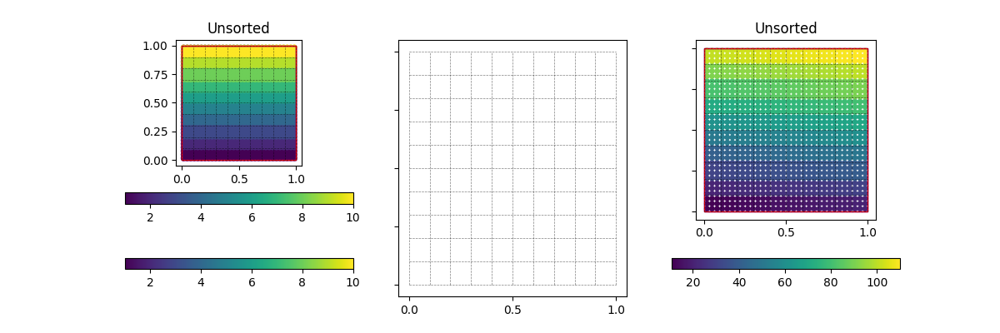

In [ ]:
fig, axis = plt.subplots(1, 4, figsize=(12,4), sharex = True, sharey = True, squeeze = False)

for i in range(numCells + 1):
    for ii in range(axis.shape[1]):
        axis[0,ii].vlines(x = qMin[0] + i * hCell, ymin = qMin[0], ymax = qMax[0], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)
        axis[0,ii].hlines(y = qMin[1] + i * hCell, xmin = qMin[1], xmax = qMax[1], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)

scatterSize = 500 / math.sqrt(x.shape[0])

sc = axis[0,0].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedIndices[:,0], s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,0], orientation='horizontal')
axis[0,0].set_title('Unsorted')
axis[0,0].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,0].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,0].set_aspect(1, adjustable='box')

sc = axis[0,1].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedIndices[:,1], s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,1], orientation='horizontal')
axis[0,1].set_title('Unsorted')
axis[0,1].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,1].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,1].set_aspect(1, adjustable='box')


# sc = axis[0,2].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedLinear, s = scatterSize, label = 'Unsorted')
# fig.colorbar(sc, ax = axis[0,2], orientation='horizontal')
# axis[0,2].set_title('Unsorted')
# axis[0,2].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
# axis[0,2].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
# axis[0,2].set_aspect(1, adjustable='box')

# sc = axis[0,3].scatter(sortedPositions[:,0], sortedPositions[:,1], c = hashedParticleIndices, s = scatterSize, label = 'Unsorted')
# fig.colorbar(sc, ax = axis[0,3], orientation='horizontal')
# axis[0,3].set_title('Unsorted')
# axis[0,3].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
# axis[0,3].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
# axis[0,3].set_aspect(1, adjustable='box')


In [ ]:
fig, axis = plt.subplots(1, 4, figsize=(12,4), sharex = True, sharey = True, squeeze = False)

for i in range(numCells + 1):
    for ii in range(axis.shape[1]):
        axis[0,ii].vlines(x = qMin[0] + i * hCell, ymin = qMin[0], ymax = qMax[0], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)
        axis[0,ii].hlines(y = qMin[1] + i * hCell, xmin = qMin[1], xmax = qMax[1], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)

scatterSize = 500 / math.sqrt(x.shape[0])

sc = axis[0,0].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedIndices[:,0], s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,0], orientation='horizontal')
axis[0,0].set_title('Unsorted')
axis[0,0].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,0].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,0].set_aspect(1, adjustable='box')

sc = axis[0,1].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedIndices[:,1], s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,1], orientation='horizontal')
axis[0,1].set_title('Unsorted')
axis[0,1].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,1].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,1].set_aspect(1, adjustable='box')


# sc = axis[0,2].scatter(sortedPositions[:,0], sortedPositions[:,1], c = sortedLinear, s = scatterSize, label = 'Unsorted')
# fig.colorbar(sc, ax = axis[0,2], orientation='horizontal')
# axis[0,2].set_title('Unsorted')
# axis[0,2].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
# axis[0,2].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
# axis[0,2].set_aspect(1, adjustable='box')

# sc = axis[0,3].scatter(sortedPositions[:,0], sortedPositions[:,1], c = hashedParticleIndices, s = scatterSize, label = 'Unsorted')
# fig.colorbar(sc, ax = axis[0,3], orientation='horizontal')
# axis[0,3].set_title('Unsorted')
# axis[0,3].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
# axis[0,3].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
# axis[0,3].set_aspect(1, adjustable='box')


tensor([0., 0.])

In [ ]:
hashedIndices = hashCellIndices(cellGridIndices, hashMapLength)
hashIndexSorting = torch.argsort(hashedIndices)

hashMap, hashMapCounters = torch.unique_consecutive(hashedIndices[hashIndexSorting], return_counts=True, return_inverse=False)
hashMapCounters = hashMapCounters.to(torch.int32)
sortedCellIndices = cellIndices[hashIndexSorting]
sortedCumCell = cellCounters[hashIndexSorting]
cellSpan = cumCell[hashIndexSorting]

hashTable = hashMap.new_ones(hashMapLength,2) * -1
hashTable[:,1] = 0
hashMap64 = hashMap.to(torch.int64)
hashTable[hashMap64,0] = torch.hstack((torch.tensor([0], device = sortedCellIndices.device, dtype=sortedCellIndices.dtype),torch.cumsum(hashMapCounters,dim=0)))[:-1].to(torch.int32) #torch.cumsum(hashMapCounters, dim = 0) #torch.arange(hashMap.shape[0], device=hashMap.device)

hashTable[hashMap64,1] = hashMapCounters

print(hashTable[hashTable[:,0] != -1].shape)

torch.Size([100, 2])


In [ ]:
print(cellIndices.shape)
print(hashedIndices)
print(hashMap, hashMapCounters)
print(hashTable)

torch.Size([100])
tensor([1276, 2393, 3510,  531, 1648, 2765, 3882,  903, 2020, 3137, 1435, 2552,
        3669,  690, 1807, 2924, 4041, 1062, 2179, 3296, 1594, 2711, 3828,  849,
        1966, 3083,  104, 1221, 2338, 3455, 1753, 2870, 3987, 1008, 2125, 3242,
         263, 1380, 2497, 3614, 1912, 3029,   50, 1167, 2284, 3401,  422, 1539,
        2656, 3773, 2071, 3188,  209, 1326, 2443, 3560,  581, 1698, 2815, 3932,
        2230, 3347,  368, 1485, 2602, 3719,  740, 1857, 2974, 4091, 2389, 3506,
         527, 1644, 2761, 3878,  899, 2016, 3133,  154, 2548, 3665,  686, 1803,
        2920, 4037, 1058, 2175, 3292,  313, 2707, 3824,  845, 1962, 3079,  100,
        1217, 2334, 3451,  472], dtype=torch.int32)
tensor([  50,  100,  104,  154,  209,  263,  313,  368,  422,  472,  527,  531,
         581,  686,  690,  740,  845,  849,  899,  903, 1008, 1058, 1062, 1167,
        1217, 1221, 1276, 1326, 1380, 1435, 1485, 1539, 1594, 1644, 1648, 1698,
        1753, 1803, 1807, 1857, 1912, 1962, 1966, 

In [ ]:
y = torch.clone(x)
ySupport = supports

def queryCell(cellIndex):
    # print('cellIndex:', cellIndex)
    linearIndex = cellIndex[0] + numCells * cellIndex[1]
    # print('linearIndex:', linearIndex)
    hashedIndex = hashCellIndices(cellIndex.view(-1,y.shape[1]), hashMapLength)
    # print('hashedIndex:', hashedIndex)

    tableEntry = hashTable[hashedIndex,:]
    # print(tableEntry)
    hBegin = tableEntry[:,0][0]
    hLength = tableEntry[:,1][0]
    # print('hBegin:', hBegin, 'hLength:', hLength)

    if hBegin != -1:
        cellEntries = cellSpan[hBegin:hBegin + hLength]
        cellLengths = sortedCumCell[hBegin:hBegin + hLength]
        cellLinearIndices = sortedCellIndices[hBegin:hBegin + hLength]
        if linearIndex in cellLinearIndices:
            # print('found')
            cBegin = cellEntries[cellLinearIndices == linearIndex][0]
            cLength = cellLengths[cellLinearIndices == linearIndex][0]
            particlesInCell = torch.arange(cBegin, cBegin + cLength, device = linearIndex.device, dtype = linearIndex.dtype)
            # print(particlesInCell)
            return particlesInCell
    return torch.tensor([], dtype = linearIndex.dtype, device = linearIndex.device)

queryPosition = y[0,:]
querySupport = ySupport[0]

centerCell = torch.ceil((queryPosition - qMin) / hCell).to(torch.int32)
print(centerCell)

for xx in range(-1,2):
    for yy in range(-1,2):
        cellIndex = centerCell + torch.tensor([xx,yy], device = centerCell.device, dtype = centerCell.dtype)
        print(xx, yy, centerCell, cellIndex)
        cellIndex = cellIndex % numCells
        print(cellIndex)
        particlesInCell = queryCell(cellIndex)
        print(particlesInCell)


particlesInCell = queryCell(centerCell)
print(particlesInCell)



tensor([1, 1], dtype=torch.int32)
-1 -1 tensor([1, 1], dtype=torch.int32) tensor([0, 0], dtype=torch.int32)
tensor([0, 0], dtype=torch.int32)
tensor([], dtype=torch.int32)
-1 0 tensor([1, 1], dtype=torch.int32) tensor([0, 1], dtype=torch.int32)
tensor([0, 1], dtype=torch.int32)
tensor([], dtype=torch.int32)
-1 1 tensor([1, 1], dtype=torch.int32) tensor([0, 2], dtype=torch.int32)
tensor([0, 2], dtype=torch.int32)
tensor([], dtype=torch.int32)
0 -1 tensor([1, 1], dtype=torch.int32) tensor([1, 0], dtype=torch.int32)
tensor([1, 0], dtype=torch.int32)
tensor([], dtype=torch.int32)
0 0 tensor([1, 1], dtype=torch.int32) tensor([1, 1], dtype=torch.int32)
tensor([1, 1], dtype=torch.int32)
tensor([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype=torch.int32)
0 1 tensor([1, 1], dtype=torch.int32) tensor([1, 2], dtype=torch.int32)
tensor([1, 2], dtype=torch.int32)
tensor([ 96,  97,  98,  99, 100, 101, 102, 103, 104], dtype=torch.int32)
1 -1 tensor([1, 1], dtype=torch.int32) tensor([2, 0], dtype=torch.int32)
tens

In [ ]:
-1 % 7

6

In [ ]:


device = 'cuda' if torch.cuda.is_available() else 'cpu'

if not y.is_cuda:
    i, j = neighborSearch.buildNeighborListUnsortedPerParticle(
        y, ySupport, 
        sortedPositions, sortedSupport,
        hashTable, sortedCellIndices, cumCell, cellCounters, sortIndex.to(torch.int32), numCells, hashMapLength, 
        qMin.type(torch.float32), np.float32(hCell), 1)
else:
    i, j = neighborSearch.buildNeighborListCUDA(y.to(device), ySupport.to(device), sortedPositions.to(device), sortedSupport.to(device), hashTable.to(device), 
                sortedCellIndices.to(device), cumCell.to(device), cellCounters.to(device), sortIndex.to(torch.int32).to(device), qMin.to(device), hCell, numCells, hashMapLength, 1)

In [ ]:
i, j = neighborSearch.buildNeighborListCUDA(
    y.to(device), ySupport.to(device), sortedPositions.to(device), sortedSupport.to(device), hashTable.to(device), 
    sortedCellIndices.to(device), cumCell.to(device), cellCounters.to(device), sortIndex.to(torch.int32).to(device), qMin.to(device), hCell, numCells, hashMapLength, 1)

RuntimeError: expected scalar type Float but found Long

In [ ]:
# print(i.shape, i)
ii, ni = torch.unique(i, return_counts=True)
jj, nj = torch.unique(j, return_counts=True)

print('i:', i.shape, 'j:', j.shape)
print('ii:', ii.shape, 'ni:', ni.shape, ni)
print('jj:', jj.shape, 'nj:', nj.shape, nj)


i: torch.Size([0]) j: torch.Size([0])
ii: torch.Size([0]) ni: torch.Size([0]) tensor([], dtype=torch.int64)
jj: torch.Size([0]) nj: torch.Size([0]) tensor([], dtype=torch.int64)


ValueError: 'c' argument has 71 elements, which is inconsistent with 'x' and 'y' with size 1024.

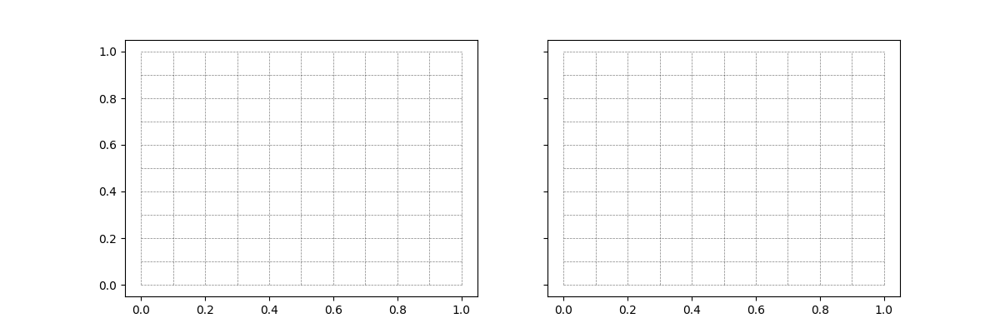

In [ ]:


fig, axis = plt.subplots(1, 2, figsize=(12,4), sharex = True, sharey = True, squeeze = False)

for ci in range(numCells + 1):
    for ii in range(axis.shape[1]):
        axis[0,ii].vlines(x = qMin[0] + ci * hCell, ymin = qMin[0], ymax = qMax[0], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)
        axis[0,ii].hlines(y = qMin[1] + ci * hCell, xmin = qMin[1], xmax = qMax[1], color = 'black', linestyle = '--', alpha = 0.5, lw = 0.5)

scatterSize = 500 / math.sqrt(x.shape[0])

sc = axis[0,0].scatter(sortedPositions[:,0], sortedPositions[:,1], c = ni, s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,0], orientation='horizontal')
axis[0,0].set_title('Unsorted')
axis[0,0].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,0].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,0].set_aspect(1, adjustable='box')

sc = axis[0,1].scatter(y[:,0], y[:,1], c = nj, s = scatterSize, label = 'Unsorted')
fig.colorbar(sc, ax = axis[0,1], orientation='horizontal')
axis[0,1].set_title('Unsorted')
axis[0,1].add_patch(patches.Rectangle((minDomain[0], minDomain[1]), maxDomain[0] - minDomain[0], maxDomain[1] - minDomain[1], fill=False, edgecolor='b', linewidth = 1))
axis[0,1].add_patch(patches.Rectangle((qMin[0], qMin[1]), qMax[0] - qMin[0], qMax[1] - qMin[1], fill=False, edgecolor='r', linewidth = 1))
axis[0,1].set_aspect(1, adjustable='box')


In [ ]:
print('y', y.shape)
print('ySupport', ySupport.shape)
print('sortedPositions', sortedPositions.shape)
print('sortedSupport', sortedSupport.shape)
print('hashTable', hashTable.shape)
print('cellIndices', cellIndices.shape)
print('cumCell', cumCell.shape)
print('cellCounters', cellCounters.shape)
print('sortIndex', sortIndex.shape)
print('numCells', numCells)
print('hashMapLength', hashMapLength)
print('qMin', qMin)
print('hCell', hCell)
# print('i', i.shape)

y torch.Size([1024, 2])
ySupport torch.Size([1024])
sortedPositions torch.Size([1024, 2])
sortedSupport torch.Size([1024])
hashTable torch.Size([4, 2])
cellIndices torch.Size([100])
cumCell torch.Size([100])
cellCounters torch.Size([100])
sortIndex torch.Size([1024])
numCells 10
hashMapLength 4
qMin tensor([0, 0])
hCell 0.10000000149011612


In [ ]:
sortedLinear[:10]

tensor([11, 11, 11, 11, 11, 11, 11, 11, 11, 12], dtype=torch.int32)

In [ ]:
# @torch.jit.script
# def constructHashMap(sortedPositions, sortedSupport, sortedIndices, sort, hashMapLength : int, cellCount : int):
#     with record_function("hashmap"): 
#         # First create a list of occupied cells and then create a cumsum to figure out where each cell starts in the data
#         with record_function("hashmap - cell cumulation"): 
#             cellIndices, cellCounters = torch.unique_consecutive(sortedIndices, return_counts=True, return_inverse=False)
#             cellCounters = cellCounters.to(torch.int32)
#             cumCell = torch.hstack((torch.tensor([0], device = cellIndices.device, dtype=cellCounters.dtype),torch.cumsum(cellCounters,dim=0)))[:-1].to(torch.int32)
            
#         # Now compute the hash indices of all particles by reversing the linearIndices            
#         with record_function('hashmap - compute indices'): 
#             xIndices = cellIndices % cellCount
#             yIndices = torch.div(cellIndices, cellCount, rounding_mode='trunc')
#             hashedIndices = (xIndices * 3 + yIndices * 5) % hashMapLength
#         # Sort the hashes and use unique consecutive to find hash collisions. Then resort the cell indices based on the hash indices
#         with record_function('hashmap - sort hashes'): 
#             hashIndexSorting = torch.argsort(hashedIndices)
#         with record_function('hashmap - collision detection'): 
#             hashMap, hashMapCounters = torch.unique_consecutive(hashedIndices[hashIndexSorting], return_counts=True, return_inverse=False)
#             hashMapCounters = hashMapCounters.to(torch.int32)
#             cellIndices = cellIndices[hashIndexSorting]
#             cellSpan = cumCell[hashIndexSorting]
#             cumCell = cellCounters[hashIndexSorting]
#         # Now construct the hashtable
#         with record_function('hashmap - hashmap construction'):
#             hashTable = hashMap.new_ones(hashMapLength,2) * -1
#             hashTable[:,1] = 0
#             hashMap64 = hashMap.to(torch.int64)
#             hashTable[hashMap64,0] = torch.hstack((torch.tensor([0], device = cellIndices.device, dtype=cellIndices.dtype),torch.cumsum(hashMapCounters,dim=0)))[:-1].to(torch.int32) #torch.cumsum(hashMapCounters, dim = 0) #torch.arange(hashMap.shape[0], device=hashMap.device)
#             hashTable[hashMap64,1] = hashMapCounters
#     return hashTable, cellIndices, cumCell, cellSpan
# hashTable, cellLinearIndices, cellOffsets, cellParticleCounters = constructHashMap(sortedPositions, sortedSupport, sortedLinearIndices, sortingIndices, hashMapLength, cellCount)

In [ ]:
print(arg, packing**dim)

0.0625 0.00390625


In [ ]:

dim = 3
packing = 2 / 32
arg = packing**dim
dtype = torch.float32
device = 'cpu'
targetNeighbors = 50
kernel = getKernel('Wendland2')


In [ ]:
newPacking, *_ = optimizeArea(packing**dim, packing, torch.float64, 'cpu', targetNeighbors, kernel, dim = dim, thresh = 1e-7, maxIter = 32)
# print(newPacking[0] / packing**dim)

In [ ]:
evalArea(0.0625, 2 / 32, torch.float32, 'cpu', targetNeighbors = 50, kernel = Kernel, dim = 2)

tensor([-1.9947, -1.9947])
0.9973557010035817
tensor(0.0625)


NameError: name 'genParticlesCentered' is not defined

In [ ]:
def sampleRegular(nx = 32, minExtent = [-1, -1], maxExtent = [1,1], targetNeighbors = 50, correctedArea = False):
    dx = (maxExtent[0] - minExtent[0]) / nx            
    area = dx**2
    if correctedArea:
        area =  minimize(lambda r: evalArea(r[0], dx, torch.float32, 'cpu', targetNeighbors = targetNeighbors), area, method="nelder-mead", bounds =[(area * 1e-5,area *2)], tol = 1e-7).x[0]
    support = np.single(np.sqrt(area / np.pi * targetNeighbors))
    
    
    xx = np.linspace(minDomain[0] + dx / 2, maxExtent[0] - dx / 2, nx)
    yy = np.linspace(minDomain[1] + dx / 2, maxExtent[1] - dx / 2, nx)

    XX, YY = np.meshgrid(xx,yy)
    ptcls = np.stack((XX,YY), axis = 2).flatten().reshape((nx * nx, 2))

    return torch.tensor(ptcls), torch.ones(ptcls.shape[0]) * area, torch.ones(ptcls.shape[0]) * support



In [ ]:
from typing import List
def sampleRegular(nx: int = 32, minExtent : float | List[float] = -1, maxExtent : float | List[float] = 1, targetNeighbors : int = 50, correctedArea : bool = False, kernel = None):
    minDomain = torch.tensor([minExtent]).to(torch.float32) if isinstance(minExtent, float) or isinstance(minExtent, int) else torch.tensor(minExtent).to(torch.float32)
    maxDomain = torch.tensor([maxExtent]).to(torch.float32) if isinstance(maxExtent, float) or isinstance(maxExtent, int) else torch.tensor(maxExtent).to(torch.float32)
    dim = minDomain.shape[0]
    dx = (maxDomain[0] - minDomain[0]) / nx          
    area = dx**(dim)
    print(area)
    
    if correctedArea:
        area, *_ = optimizeArea(area, packing, torch.float64, 'cpu', targetNeighbors, kernel, dim = dim, thresh = 1e-7, maxIter = 32)
    ns = [torch.ceil((maxDomain[i] - minDomain[i]) / dx).to(torch.long) for i in range(minDomain.shape[0])]
    lins = [torch.linspace(minDomain[i] + dx / 2, maxDomain[i] - dx/2, ns[i]) for i in range(minDomain.shape[0])]

    if dim == 1:
        return lins[0].view(-1,1)
    elif dim == 2:    
        xx, yy = torch.meshgrid(lins[0],lins[1], indexing = 'xy')
        p = torch.stack((xx,yy), dim = -1).flatten(0,1)
        return p
    elif dim == 3:
        xx, yy, zz = torch.meshgrid(lins[0],lins[1], lins[2], indexing = 'xy')
        p = torch.stack((xx,yy, zz), dim = -1).flatten(0,2)
        return p

    

sampleRegular(32, [-1, -1], [1, 2])
    

tensor(0.0039)


torch.Size([1536, 2])

In [ ]:
32 * 48

1536

In [ ]:
config = 'configs/periodicDomain.toml'

with open(config, 'r') as file:
    tomlConfig = file.read()
parsedConfig = tomli.loads(tomlConfig)

simulationModel = deltaSPHSimulation
# simulationModel = dfsphSimulation

sphSimulation = simulationModel(parsedConfig)
sphSimulation.initializeSimulation()
state = sphSimulation.simulationState
state['fluidVelocity'] = 4.0 * state['fluidVelocity'] / torch.max(torch.linalg.norm(state['fluidVelocity'], dim = -1))

# A = 1
# B = -1
# k = np.pi
# state['fluidVelocity'][:,0] =  4 * torch.cos(k * state['fluidPosition'][:,0]) * torch.sin(k * state['fluidPosition'][:,1])
# state['fluidVelocity'][:,1] = -4 * torch.sin(k * state['fluidPosition'][:,0]) * torch.cos(k * state['fluidPosition'][:,1])


sphSimulation.integrate()


/home/winchenbach/dev/diffSPH/src/diffSPH/simulationBase.py:350: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  emitterPositions = torch.tensor(self.generated['ptcls'], dtype = self.dtype, device = self.device)


In [ ]:
from diffSPH.modules.neighborSearch import periodicNeighborSearchXY
from diffSPH.kernels import kernel


nx = 128
x = np.linspace(-1,1,nx)
y = np.linspace(-1,1,nx)
# x = np.linspace(0,2*np.pi,nx)
# y = np.linspace(0,2*np.pi,nx)
xx, yy = np.meshgrid(x,y)
pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
print(pos.shape)
i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                            sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                            sphSimulation.config['particle']['support'], 
                                                            sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])


vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')


torch.Size([16384, 2])


/home/winchenbach/anaconda3/envs/torch2/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
NavigationToolbar2WebAgg.__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


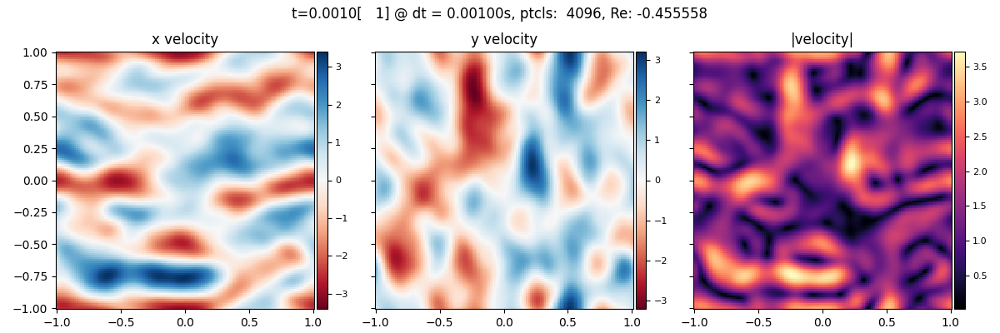

In [ ]:

def updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis):
    nx = 128
    x = np.linspace(-1,1,nx)
    y = np.linspace(-1,1,nx)
    xx, yy = np.meshgrid(x,y)
    pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
#     print(pos.shape)
    i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                                sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                                sphSimulation.config['particle']['support'], 
                                                                sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])

    vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')
    xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
    yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()

    vorticity = np.gradient(yVel)[0] - np.gradient(xVel)[1]

    # pMeshV.set_array(vorticity)
    pMeshX.set_array(xVel)
    pMeshY.set_array(yVel)
    pMeshN.set_array(np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2))

        
    positions = state['fluidPosition'].detach().cpu().numpy()
    data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
    minD = torch.tensor(sphSimulation.config['domain']['min']).cpu().numpy()
    maxD = torch.tensor(sphSimulation.config['domain']['max']).cpu().numpy()
    # y = np.remainder(positions - minD, maxD - minD) + minD
    # sc.set_offsets(np.c_[y[:,0], y[:,1]])
    # sc.set_array(data)

    nu = np.log(data.max()/4) /(-2 * np.pi**2 * sphSimulation.simulationState['time']) / 4
    Re = data.max() * 2 / nu
    fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d, Re: %g'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles'], Re))
    # axis[0,0].cla()
    # axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
    # axis[0,0].set_xlim(-1,1)
    # axis[0,0].set_ylim(-1,1)
    # axis[0,0].set_aspect(1)
    
fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = True, sharey = True, squeeze = False)


def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'magma')
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

def pMesh2(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'RdBu', vmin = -np.max(np.abs(data)), vmax = np.max(np.abs(data)))
    # sc = axis.pcolormesh(xx,yy,data, cmap = 'icefire', vmin = -2.5, vmax = 2.5)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
vorticity = np.gradient(yVel)[0] - np.gradient(xVel)[1]
state = sphSimulation.simulationState
# pMeshV = pMesh2(fig,axis[0,0], xx, yy, vorticity, 'vorticity')
positions = state['fluidPosition'].detach().cpu().numpy()
data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
minD = torch.tensor(sphSimulation.config['domain']['min']).cpu().numpy()
maxD = torch.tensor(sphSimulation.config['domain']['max']).cpu().numpy()
y = np.remainder(positions - minD, maxD - minD) + minD
# sc = axis[0,0].scatter(y[:,0], y[:,1], c = torch.linalg.norm(sphSimulation.simulationState['fluidVelocity'], dim = -1).cpu().numpy(), s = 1,cmap = 'magma')
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
# axis[0,0].set_box_aspect(1)
# axis[0,0].set_title('Particle |velocity|')

pMeshX = pMesh2(fig,axis[0,0], xx, yy, xVel, 'x velocity')
pMeshY = pMesh2(fig,axis[0,1], xx, yy, yVel, 'y velocity')
pMeshN = pMesh( fig,axis[0,2], xx, yy, np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), '|velocity|')
    
# axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
nu = np.log(data.max()) /(-2 * np.pi**2 * sphSimulation.simulationState['time']) / 4
Re = data.max() * 2 / nu
fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d, Re: %g'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles'], Re))
        
fig.tight_layout()

# timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
# path = '../../images/periodic/%s - %s/' % (config.split('/')[-1].split('.')[0], timestamp)
# if not os.path.exists(path):
#     os.makedirs(path)
# timesteps = 4096 * 4
# # timesteps = 2424
# for i in tqdm(range(timesteps)):
#     sphSimulation.integrate()
# #     break
# #     sphSimulation.timestep()
#     if i  % 64 == 0 or i == timesteps - 1:
# #     if True:
#         state = sphSimulation.simulationState        

#         updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis)
        
#         fig.canvas.draw()
#         fig.canvas.flush_events()
        
#         imagePath = path + '%05d.png' % state['timestep']
#         # plt.savefig(imagePath)

In [ ]:
# timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
# path = '../../images/periodic/%s - %s/' % (config.split('/')[-1].split('.')[0], timestamp)
# if not os.path.exists(path):
#     os.makedirs(path)
timesteps = 512
# timesteps = 2424
for i in tqdm(range(timesteps)):
    sphSimulation.integrate()
#     break
#     sphSimulation.timestep()
    if i  % 64 == 0 or i == timesteps - 1:
#     if True:
        state = sphSimulation.simulationState        

        updatePlot(sphSimulation, None, pMeshX, pMeshY, pMeshN, None, fig, axis)
        
        fig.canvas.draw()
        fig.canvas.flush_events()
        
        # imagePath = path + '%05d.png' % state['timestep']
        # plt.savefig(imagePath)

  0%|          | 0/512 [00:00<?, ?it/s]

In [ ]:
from diffSPH.v2.neighborhood import neighborSearch
from diffSPH.v2.math import scatter_sum
from diffSPH.v2.sphOps import *

In [ ]:
# @torch.jit.script
# def wendland4(q, h):
#     C = 7 / np.pi
#     b1 = torch.pow(1. - q, 4)
#     b2 = 1.0 + 4.0 * q
#     return b1 * b2 * C / h**2  
# @torch.jit.script
# def wendland4Grad(q,r,h):
#     C = 7 / np.pi    
#     return - r * C * (20. * q * (1. -q)**3/ h**3 )[:,None]

In [ ]:
Kernel = getKernel('Wendland2')

positions = sphSimulation.simulationState['fluidPosition']

x = torch.clone(positions)
y = torch.clone(positions[:positions.shape[0]//2,:])
y = torch.clone(positions)
# print(y)
hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
hy = torch.clone(sphSimulation.perennialState['fluidSupport'][:y.shape[0]])


periodicX = True
periodicY = True
minDomain = [-1,-1]
maxDomain = [1,1]

i, j, rij, xij, hij = neighborSearch(x, y, hx, hy, [periodicX, periodicY], minDomain, maxDomain)

kernel = Kernel.kernel(rij, hij)
gradKernel = Kernel.kernelGradient(rij, xij, hij)

[True, True]


In [ ]:

@torch.jit.script
def mod(x, min : float, max : float):
    return torch.where(torch.abs(x) > (max - min) / 2, torch.sgn(x) * ((torch.abs(x) + min) % (max - min) + min), x)


periodicity = [True, False]
pos_x = x
pos_y = y

pos_x = torch.stack([x[:,i] if not periodic else torch.remainder(x[:,i] - minDomain[i], maxDomain[i] - minDomain[i]) + minDomain[i] for i, periodic in enumerate(periodicity)], dim = 1)
distanceMatrices = torch.stack([pos_x[:,i] - pos_y[:,i,None] if not periodic else mod(pos_x[:,i] - pos_y[:,i,None], minDomain[i], maxDomain[i]) for i, periodic in enumerate(periodicity)], dim = -1)
distanceMatrix = torch.sqrt(torch.sum(distanceMatrices**2, dim = -1))
mode = 'gather'
indexI, indexJ = torch.meshgrid(torch.arange(x.shape[0]).to(x.device), torch.arange(y.shape[0]).to(y.device), indexing = 'xy')
if mode == 'gather':        
    gatherMatrix = hx.repeat(hy.shape[0],1)
    adjacencyDense = distanceMatrix <= gatherMatrix
    supports = gatherMatrix[adjacencyDense]
elif mode == 'scatter':        
    scatterMatrix = hy.repeat(hx.shape[0],1).mT
    adjacencyDense = distanceMatrix <= scatterMatrix
    supports = scatterMatrix[adjacencyDense]
else:
    symmetricMatrix = (hx + hy[:,None]) / 2
    adjacencyDense = distanceMatrix <= symmetricMatrix
    supports = symmetricMatrix[adjacencyDense]

ii = indexI[adjacencyDense]
jj = indexJ[adjacencyDense]

distanceMatrices[adjacencyDense]

tensor([[ 0.0000e+00,  0.0000e+00],
        [-1.6820e-02, -1.6484e-02],
        [-8.5783e-02, -3.5017e-03],
        ...,
        [-1.0692e-01,  6.3590e-02],
        [ 3.4314e-02,  2.4055e-02],
        [-5.9605e-08,  0.0000e+00]], device='cuda:0')

In [ ]:


# from typing import Dict, Optional
# # ------ Beginning of scatter functionality ------ #
# # Scatter summation functionality based on pytorch geometric scatter functionality
# # This is included here to make the code independent of pytorch geometric for portability
# # Note that pytorch geometric is licensed under an MIT licenses for the PyG Team <team@pyg.org>
# @torch.jit.script
# def broadcast(src: torch.Tensor, other: torch.Tensor, dim: int):
#     if dim < 0:
#         dim = other.dim() + dim
#     if src.dim() == 1:
#         for _ in range(0, dim):
#             src = src.unsqueeze(0)
#     for _ in range(src.dim(), other.dim()):
#         src = src.unsqueeze(-1)
#     src = src.expand(other.size())
#     return src

# @torch.jit.script
# def scatter_sum(src: torch.Tensor, index: torch.Tensor, dim: int = -1,
#                 out: Optional[torch.Tensor] = None,
#                 dim_size: Optional[int] = None) -> torch.Tensor:
#     index = broadcast(index, src, dim)
#     if out is None:
#         size = list(src.size())
#         if dim_size is not None:
#             size[dim] = dim_size
#         elif index.numel() == 0:
#             size[dim] = 0
#         else:
#             size[dim] = int(index.max()) + 1
#         out = torch.zeros(size, dtype=src.dtype, device=src.device)
#         return out.scatter_add_(dim, index, src)
#     else:
#         return out.scatter_add_(dim, index, src)
# # ------ End of scatter functionality ------ #


In [ ]:
from diffSPH.v2.math import scatter_sum
from diffSPH.v2.sphOps import *

ImportError: cannot import name 'scatter_sum' from 'diffSPH.v2.math' (/home/winchenbach/dev/diffSPH/src/diffSPH/v2/math.py)

In [ ]:

# def sphInterpolation(fluidMasses, fluidDensities, fluidQuantities, fluidNeighbors, fluidKernels, fluidKernelGradients, numParticles):
#     i = fluidNeighbors[0]
#     j = fluidNeighbors[1]
#     return scatter_sum(fluidMasses[1][j] / fluidDensities[1][j] * fluidQuantities[1][j] * fluidKernels, i, dim = 0, dim_size = numParticles)

In [ ]:
torch.linalg.norm(xij, dim = -1)

tensor([0., 1., 1.,  ..., 1., 1., 0.], device='cuda:0')

In [ ]:

x = torch.clone(positions)
hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
h = torch.max(hx).item() * 2
area = sphSimulation.simulationState['fluidArea']


minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)

if periodicX and not periodicY:
    pos_x = torch.stack((torch.remainder(x[:,0] - minD[0], maxD[0] - minD[0]) + minD[0], x[:,1]), dim = 1)
elif not periodicX and periodicY:
    pos_x = torch.stack((x[:,0], torch.remainder(x[:,1] - minD[1], maxD[1] - minD[1]) + minD[1]), dim = 1)
elif periodicX and periodicY:
    pos_x = torch.remainder(x - minD, maxD - minD) + minD
else:
    pos_x = x  
rho = sphSimulation.perennialState['fluidDensity']
q = torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi)

q[:] = 1

In [ ]:
masses = (area, area)
densities = (rho, rho)
quantities = (q, q)
neighborhood = (i, j)
kernels = kernel
gradKernels = gradKernel
laplacianKernels = Kernel.kernelLaplacian(rij, hij, dim = 2)
laplacianKernels[rij < 1e-3] = laplacianKernels.max()

q = torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi)
qv = torch.stack((torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi), torch.sin(pos_x[:,0] * np.pi) * torch.cos(pos_x[:,1] * np.pi) ), dim = 1)
rv = torch.stack((torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi), torch.sin(pos_x[:,0] * np.pi) * torch.cos(pos_x[:,1] * np.pi) ), dim = 1)
cv = torch.stack((torch.cos(pos_x[:,1] * np.pi) * torch.sin(pos_x[:,0] * np.pi), torch.sin(pos_x[:,1] * np.pi) * torch.cos(pos_x[:,0] * np.pi) ), dim = 1)
qm = torch.stack((rv, cv), dim = 1)



In [ ]:
def scatterPlot(fig, axis, pos_x, s, c, cmap = 'viridis', title = None):
    sc = axis.scatter(pos_x[:,0].detach().cpu().numpy(), pos_x[:,1].detach().cpu().numpy(), s = s, c = c.detach().cpu().numpy(), cmap = cmap)

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cb = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cb.ax.tick_params(labelsize=8)
    axis.axis('equal')
    axis.set_xlim(minDomain[0], maxDomain[0])
    axis.set_ylim(minDomain[1], maxDomain[1])
    if title is not None:
        axis.set_title(title)


x = torch.clone(positions)
hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
h = torch.max(hx).item() * 1.245
area = sphSimulation.simulationState['fluidArea']


minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)

if periodicX and not periodicY:
    pos_x = torch.stack((torch.remainder(x[:,0] - minD[0], maxD[0] - minD[0]) + minD[0], x[:,1]), dim = 1)
elif not periodicX and periodicY:
    pos_x = torch.stack((x[:,0], torch.remainder(x[:,1] - minD[1], maxD[1] - minD[1]) + minD[1]), dim = 1)
elif periodicX and periodicY:
    pos_x = torch.remainder(x - minD, maxD - minD) + minD
else:
    pos_x = x  
    


i, j, rij, xij, hij = neighborSearch(x, x, h, h, [True, True], minDomain, maxDomain)
Kernel = getKernel('Wendland2')

kernel = Kernel.kernel(rij, hij)
gradKernel = Kernel.kernelGradient(rij, xij, hij)
laplacianKernels = Kernel.kernelLaplacian(rij, hij, dim = 2)
# laplacianKernels[rij < 1e-3] = 0#laplacianKernels.max()




# area.requires_grad = True
density = sphInterpolation((None,area), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (i, j), kernel, x.shape[0])
rho = sphSimulation.perennialState['fluidDensity']


[True, True]


In [ ]:
# err = torch.abs(torch.mean(density) - 1)

In [ ]:
# print(err)

In [ ]:
# gradientType = 'gradientSymmetric'
gradientType = 'difference'
# gradientType = 'gradientSummation'
# gradientType = 'gradientNaive'

In [ ]:
# err.backward()

In [ ]:
ii, ni =torch.unique(i, return_counts = True)
print(ni)

tensor([75, 78, 79,  ..., 76, 78, 77], device='cuda:0')


naive
naive
tensor(9.8471, device='cuda:0') 9.869604401089358 tensor(0.9977, device='cuda:0')
torch.Size([4096, 2])


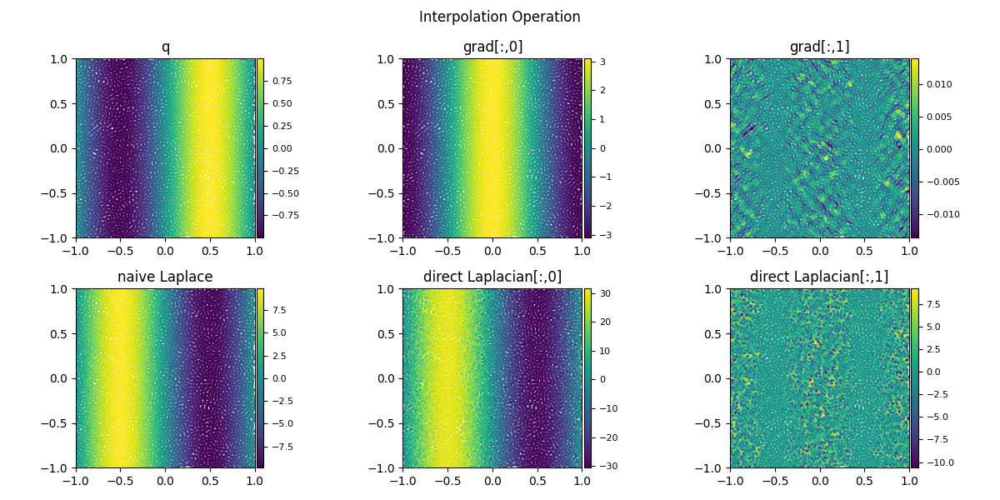

In [ ]:
q = torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi)
q = torch.abs(pos_x[:,0] / 16)**2
q = torch.sin(pos_x[:,0] * np.pi)
interpolatedNaive = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
                    operation = 'laplacian', gradientMode = 'naive', kernelLaplacians = laplacianKernels)
grad = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
                    operation = 'gradient', gradientMode = 'difference', kernelLaplacians = laplacianKernels)

fig, axis = plt.subplots(2, 3, figsize=(12,6), sharex = False, sharey = False, squeeze = False)
fig.suptitle('Interpolation Operation')
scatterPlot(fig, axis[0,0], pos_x, 4, q, 'viridis', title = 'q')
scatterPlot(fig, axis[0,1], pos_x, 4, grad[:,0], 'viridis', title = 'grad[:,0]')
scatterPlot(fig, axis[0,2], pos_x, 4, grad[:,1], 'viridis', title = 'grad[:,1]')

scatterPlot(fig, axis[1,0], pos_x, 4, interpolatedNaive, 'viridis', title = 'naive Laplace')

interpolatedNormal = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
                    operation = 'laplacian', gradientMode = 'naive', kernelLaplacians = laplacianKernels)
# scatterPlot(fig, axis[1,1], pos_x, 4, interpolatedNormal, 'viridis', title = 'Laplacian')

print(interpolatedNormal.max(), np.pi**2, interpolatedNormal.max() / np.pi**2)

        # grad = sphGradient(masses, densities, quantities, neighborhood, kernelGradients, numParticles, type = gradientMode)
        # div = sphDivergence(masses, densities, (grad, grad), neighborhood, kernelGradients, numParticles, type = gradientMode, mode = divergenceMode)

div = sphOperation((area, area), (rho, rho), (grad, grad), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
                    operation = 'divergence', gradientMode = 'naive', kernelLaplacians = laplacianKernels)

qq = torch.vstack((q, torch.zeros_like(q))).mT
# qq = torch.vstack((q, q)).mT

interpolated = sphOperation((area, area), (rho, rho), (qq, qq), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
                    operation = 'laplacian', gradientMode = 'divergenceFree', kernelLaplacians = laplacianKernels)
print(interpolated.shape)
scatterPlot(fig, axis[1,1], pos_x, 4, interpolated[:,0], 'viridis', title = 'direct Laplacian[:,0]')
scatterPlot(fig, axis[1,2], pos_x, 4, interpolated[:,1], 'viridis', title = 'direct Laplacian[:,1]')
fig.tight_layout()

In [ ]:
qq.shape

torch.Size([4096, 2])

In [ ]:
print(interpolatedNormal)
print(interpolated)
print(interpolatedNormal / interpolated[:,0])
print(torch.mean(interpolatedNormal / interpolated[:,0]))

tensor([ 1.7197,  2.0842, -6.4899,  ..., -4.1572, -9.7440, -9.7037],
       device='cuda:0')
tensor([[ 9.2605e-01, -2.4205e-01],
        [ 1.8348e-01,  5.3258e-01],
        [-1.9350e+00,  1.8795e-01],
        ...,
        [-1.7289e+00, -7.9022e-01],
        [-3.6209e+00, -1.7211e-03],
        [-3.6484e+00,  2.3803e-02]], device='cuda:0')
tensor([ 1.8570, 11.3589,  3.3540,  ...,  2.4046,  2.6910,  2.6597],
       device='cuda:0')
tensor(2.4480, device='cuda:0')


## Scalar in operations:

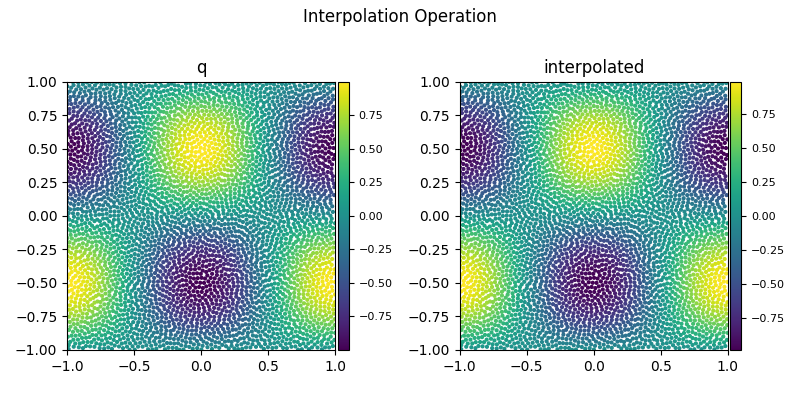

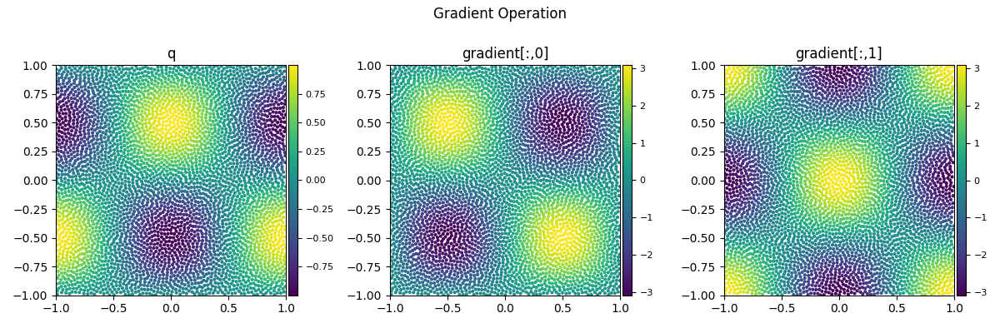

In [ ]:
q = torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi)

# q[:] = 1
interpolated = sphOperation((None, area), (None, rho), (None, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'interpolate')
gradient = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'gradient', gradientMode = 'difference')

fig, axis = plt.subplots(1, 2, figsize=(8,4), sharex = False, sharey = False, squeeze = False)
fig.suptitle('Interpolation Operation')
scatterPlot(fig, axis[0,0], pos_x, 4, q, 'viridis', title = 'q')
scatterPlot(fig, axis[0,1], pos_x, 4, interpolated, 'viridis', title = 'interpolated')
fig.tight_layout()

fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)
fig.suptitle('Gradient Operation')
scatterPlot(fig, axis[0,0], pos_x, 4, q, 'viridis', title = 'q')
scatterPlot(fig, axis[0,1], pos_x, 4, gradient[:,0], 'viridis', title = 'gradient[:,0]')
scatterPlot(fig, axis[0,2], pos_x, 4, gradient[:,1], 'viridis', title = 'gradient[:,1]')
fig.tight_layout()

# gradient = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'divergence', gradientMode = 'difference')

## Vector in operations:

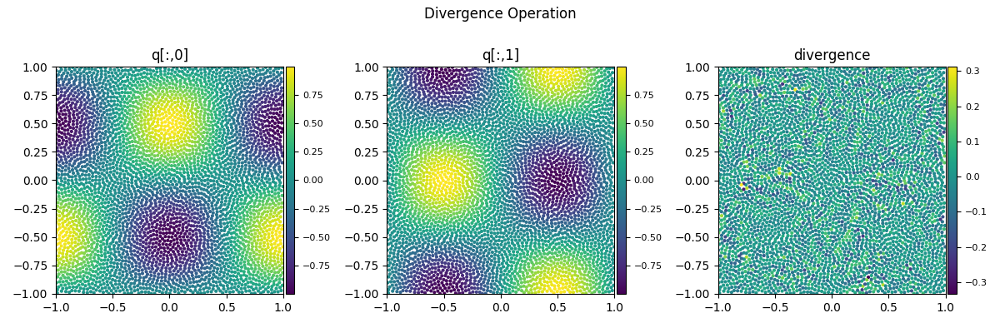

In [ ]:
q = torch.cos(pos_x[:,0])
q = torch.stack((torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi),- torch.sin(pos_x[:,0] * np.pi) * torch.cos(pos_x[:,1] * np.pi) ), dim = 1)

# q = pos_x * (torch.linalg.norm(pos_x , dim = -1)).view(-1,1)

interpolated = sphOperation((None, area), (None, rho), (None, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'interpolate')
gradient = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'gradient', gradientMode = 'difference')

# fig, axis = plt.subplots(2, 2, figsize=(8,8), sharex = False, sharey = False, squeeze = False)
# fig.suptitle('Interpolation Operation')
# scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0], 'viridis', title = 'q[:,0]')
# scatterPlot(fig, axis[1,0], pos_x, 4, q[:,1], 'viridis', title = 'q[:,1]')
# scatterPlot(fig, axis[0,1], pos_x, 4, interpolated[:,0], 'viridis', title = 'interpolated[:,0]')
# scatterPlot(fig, axis[1,1], pos_x, 4, interpolated[:,1], 'viridis', title = 'interpolated[:,1]')
# fig.tight_layout()

# fig, axis = plt.subplots(2, 3, figsize=(12,8), sharex = False, sharey = False, squeeze = False)
# fig.suptitle('Gradient Operation')
# scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0], 'viridis', title = 'q[:,0]')
# scatterPlot(fig, axis[1,0], pos_x, 4, q[:,1], 'viridis', title = 'q[:,1]')
# scatterPlot(fig, axis[0,1], pos_x, 4, gradient[:,0,0], 'viridis', title = 'gradient[:,0,0]')
# scatterPlot(fig, axis[0,2], pos_x, 4, gradient[:,0,1], 'viridis', title = 'gradient[:,0,1]')
# scatterPlot(fig, axis[1,1], pos_x, 4, gradient[:,1,0], 'viridis', title = 'gradient[:,1,0]')
# scatterPlot(fig, axis[1,2], pos_x, 4, gradient[:,1,1], 'viridis', title = 'gradient[:,1,1]')
# fig.tight_layout()

divergence = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'divergence', gradientMode = 'symmetric')

fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)
fig.suptitle('Divergence Operation')
scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0], 'viridis', title = 'q[:,0]')
scatterPlot(fig, axis[0,1], pos_x, 4, q[:,1], 'viridis', title = 'q[:,1]')
scatterPlot(fig, axis[0,2], pos_x, 4, divergence, 'viridis', title = 'divergence')
fig.tight_layout()

# curl = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'curl', gradientMode = 'symmetric')

# fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)
# fig.suptitle('Curl Operation')
# scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0], 'viridis', title = 'q[:,0]')
# scatterPlot(fig, axis[0,1], pos_x, 4, q[:,1], 'viridis', title = 'q[:,1]')
# scatterPlot(fig, axis[0,2], pos_x, 4, curl, 'viridis', title = 'curl')
# fig.tight_layout()

# laplacian = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], 
#                     operation = 'laplacian', gradientMode = 'brookshaw', kernelLaplacians = laplacianKernels)

# fig, axis = plt.subplots(2, 2, figsize=(6,6), sharex = False, sharey = False, squeeze = False)
# fig.suptitle('Curl Operation')
# scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0], 'viridis', title = 'q[:,0]')
# scatterPlot(fig, axis[1,0], pos_x, 4, q[:,1], 'viridis', title = 'q[:,1]')
# scatterPlot(fig, axis[0,1], pos_x, 4, laplacian[:,0], 'viridis', title = 'laplacian[:,0]')
# scatterPlot(fig, axis[1,1], pos_x, 4, laplacian[:,1], 'viridis', title = 'laplacian[:,1]')
# fig.tight_layout()

## Matrix in operations:

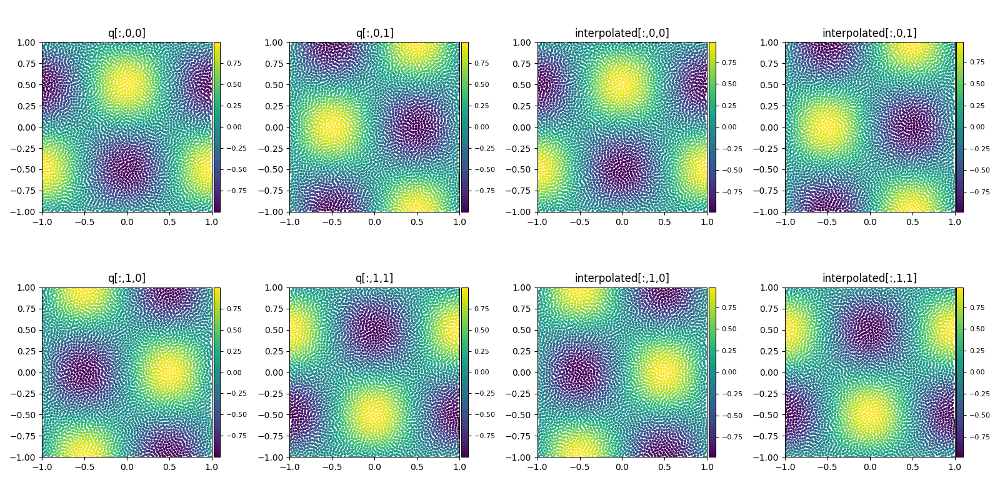

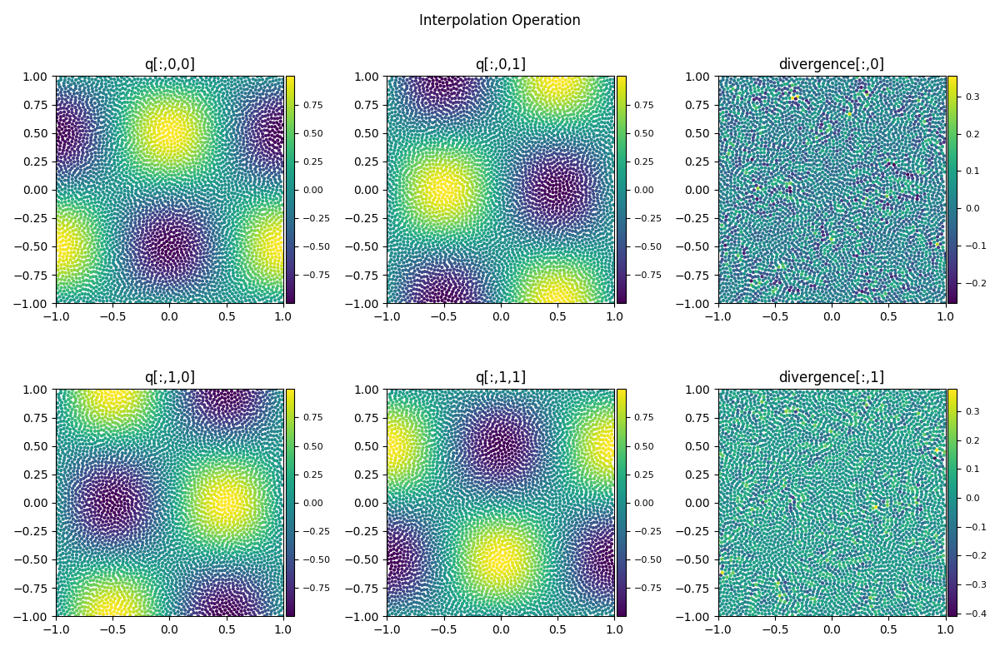

In [ ]:
rv = torch.stack((torch.cos(pos_x[:,0] * np.pi) * torch.sin(pos_x[:,1] * np.pi),- torch.sin(pos_x[:,0] * np.pi) * torch.cos(pos_x[:,1] * np.pi) ), dim = 1)
cv = torch.stack((torch.cos(pos_x[:,1] * np.pi) * torch.sin(pos_x[:,0] * np.pi), -torch.sin(pos_x[:,1] * np.pi) * torch.cos(pos_x[:,0] * np.pi) ), dim = 1)
q = torch.stack((rv, cv), dim = 1)

interpolated = sphOperation((None, area), (None, rho), (None, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'interpolate')

fig, axis = plt.subplots(2, 4, figsize=(16,8), sharex = False, sharey = False, squeeze = False)
scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0,0], 'viridis', title = 'q[:,0,0]')
scatterPlot(fig, axis[0,1], pos_x, 4, q[:,0,1], 'viridis', title = 'q[:,0,1]')
scatterPlot(fig, axis[1,0], pos_x, 4, q[:,1,0], 'viridis', title = 'q[:,1,0]')
scatterPlot(fig, axis[1,1], pos_x, 4, q[:,1,1], 'viridis', title = 'q[:,1,1]')

scatterPlot(fig, axis[0,2], pos_x, 4, interpolated[:,0,0], 'viridis', title = 'interpolated[:,0,0]')
scatterPlot(fig, axis[0,3], pos_x, 4, interpolated[:,0,1], 'viridis', title = 'interpolated[:,0,1]')
scatterPlot(fig, axis[1,2], pos_x, 4, interpolated[:,1,0], 'viridis', title = 'interpolated[:,1,0]')
scatterPlot(fig, axis[1,3], pos_x, 4, interpolated[:,1,1], 'viridis', title = 'interpolated[:,1,1]')
fig.tight_layout()



divergence = sphOperation((area, area), (rho, rho), (q, q), (i,j), kernel, gradKernel, rij, xij, hij, x.shape[0], operation = 'divergence', gradientMode = 'symmetric')

fig, axis = plt.subplots(2, 3, figsize=(12,8), sharex = False, sharey = False, squeeze = False)
fig.suptitle('Interpolation Operation')
scatterPlot(fig, axis[0,0], pos_x, 4, q[:,0,0], 'viridis', title = 'q[:,0,0]')
scatterPlot(fig, axis[0,1], pos_x, 4, q[:,0,1], 'viridis', title = 'q[:,0,1]')
scatterPlot(fig, axis[1,0], pos_x, 4, q[:,1,0], 'viridis', title = 'q[:,1,0]')
scatterPlot(fig, axis[1,1], pos_x, 4, q[:,1,1], 'viridis', title = 'q[:,1,1]')
scatterPlot(fig, axis[0,2], pos_x, 4, divergence[:,0], 'viridis', title = 'divergence[:,0]')
scatterPlot(fig, axis[1,2], pos_x, 4, divergence[:,1], 'viridis', title = 'divergence[:,1]')
fig.tight_layout()

tensor([ 0.0000e+00, -1.1921e-07,  1.1921e-07,  ..., -1.1921e-07,
        -5.9605e-08,  0.0000e+00], device='cuda:0')

In [ ]:
scalar = torch.ones(16)
matrix = torch.ones(16,2,2)

reducedShape = matrix.shape
reducedShape[1:] = 1

scalar.expand(reducedShape) * matrix

TypeError: 'torch.Size' object does not support item assignment

In [ ]:
[1] * 0

[]

In [ ]:
sliced = ([None]*0)
slice(*sliced)

TypeError: slice expected at least 1 argument, got 0

In [ ]:
def sampleRegular(nx = 32, minExtent = [-1, -1], maxExtent = [1,1], targetNeighbors = 50, correctedArea = False):
    dx = (maxExtent[0] - minExtent[0]) / nx            
    area = dx**2
    if correctedArea:
        area =  minimize(lambda r: evalArea(r[0], dx, torch.float32, 'cpu', targetNeighbors = targetNeighbors), area, method="nelder-mead", bounds =[(area * 1e-5,area *2)], tol = 1e-7).x[0]
    support = np.single(np.sqrt(area / np.pi * targetNeighbors))
    
    
    xx = np.linspace(minDomain[0] + dx / 2, maxExtent[0] - dx / 2, nx)
    yy = np.linspace(minDomain[1] + dx / 2, maxExtent[1] - dx / 2, nx)

    XX, YY = np.meshgrid(xx,yy)
    ptcls = np.stack((XX,YY), axis = 2).flatten().reshape((nx * nx, 2))

    return torch.tensor(ptcls), torch.ones(ptcls.shape[0]) * area, torch.ones(ptcls.shape[0]) * support



In [ ]:
import matplotlib

In [ ]:
def visualizeParticles(fig, axis, x, area, h, inputQuantity, periodicX = False, periodicY = False, minDomain = None, maxDomain = None, mapping = '.x', cbar = True, cmap = 'viridis', scaling = 'symlog', s = 4, linthresh = 0.5, midPoint = 1, interpolant = None):        
    print(inputQuantity.shape)

    if len(inputQuantity.shape) == 2:
        # Non scalar quantity
        if mapping == '.x' or mapping == '[0]':
            quantity = inputQuantity[:,0]
        if mapping == '.y' or mapping == '[1]':
            quantity = inputQuantity[:,1]
        if mapping == '.z' or mapping == '[2]':
            quantity = inputQuantity[:,2]
        if mapping == '.w' or mapping == '[3]':
            quantity = inputQuantity[:,3]
        if mapping == 'Linf':
            quantity = torch.linalg.norm(inputQuantity, dim = -1, ord = float('inf'))
        if mapping == 'L-inf':
            quantity = torch.linalg.norm(inputQuantity, dim = -1, ord = -float('inf'))
        if mapping == 'L0':
            quantity = torch.linalg.norm(inputQuantity, dim = -1, ord = 0)
        if mapping == 'L1':
            quantity = torch.linalg.norm(inputQuantity, dim = -1, ord = 1)
        if mapping == 'L2' or mapping == 'norm' or mapping == 'magnitude':
            quantity = torch.linalg.norm(inputQuantity, dim = -1, ord = 2)
        if mapping == 'theta':
            quantity = torch.atan2(inputQuantity[:,1], inputQuantity[:,0])

        
    
    else:
        quantity = inputQuantity

    if interpolant is not None:
        i, j, rij, xij, hij = neighborSearch(x, x, h, h, periodicX, periodicY, minDomain, maxDomain)
        Kernel = getKernel('Wendland2')
        
        kernel = Kernel.kernel(rij, hij)
        gradKernel = Kernel.kernelGradient(rij, xij, hij)
        density = sphInterpolation((None,area), (None, torch.ones_like(area)), (None, torch.ones_like(area)), (i, j), kernel, gradKernel, x.shape[0])

        print(density)
        if interpolant == 'SPH':
            quantity = sphInterpolation((None,area), (None, density), (None, quantity), (i, j), kernel, gradKernel, x.shape[0])
    
    minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
    maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)
    
    if periodicX and not periodicY:
        pos_x = torch.stack((torch.remainder(x[:,0] - minD[0], maxD[0] - minD[0]) + minD[0], x[:,1]), dim = 1)
    elif not periodicX and periodicY:
        pos_x = torch.stack((x[:,0], torch.remainder(x[:,1] - minD[1], maxD[1] - minD[1]) + minD[1]), dim = 1)
    elif periodicX and periodicY:
        pos_x = torch.remainder(x - minD, maxD - minD) + minD
    else:
        pos_x = x  

    minScale = torch.min(quantity)
    maxScale = torch.max(quantity)
    if 'sym' in scaling:
        minScale = - torch.max(torch.abs(quantity))
        maxScale =   torch.max(torch.abs(quantity))
        if 'log'in scaling:
            norm = matplotlib.colors.SymLogNorm(vmin = minScale, vmax = maxScale, linthresh = linthresh)
        else:
            minScale = - torch.max(torch.abs(quantity - midPoint))
            maxScale =   torch.max(torch.abs(quantity - midPoint))
            norm = matplotlib.colors.CenteredNorm(vcenter = midPoint, halfrange = maxScale)
    else:
        if 'log'in scaling:
            vmm = torch.min(torch.abs(quantity[quantity!= 0]))
            norm = matplotlib.colors.LogNorm(vmin = vmm, vmax = maxScale)
        else:
            norm = matplotlib.colors.Normalize(vmin = minScale, vmax = maxScale)
        
    sc = axis.scatter(pos_x[:,0].detach().cpu().numpy(), pos_x[:,1].detach().cpu().numpy(), s = s, c = quantity.detach().cpu().numpy(), cmap = cmap, norm = norm)
    if cbar:
        ax1_divider = make_axes_locatable(axis)
        cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
        cb = fig.colorbar(sc, cax=cax1,orientation='vertical')
        cb.ax.tick_params(labelsize=8)
    if periodicX:
        axis.axis('equal')
        axis.set_xlim(minDomain[0], maxDomain[0])
        axis.set_ylim(minDomain[1], maxDomain[1])
    else:
        axis.set_aspect('equal', 'box')

    return {'plot': sc, 'cbar': cb if cbar else None, 'periodic': (periodicX, periodicY), 'domain': (minDomain, maxDomain), 'mapping': mapping, 'colormap': cmap, 'scale': scaling, 'size':4}
    

/home/winchenbach/anaconda3/envs/torch2/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
NavigationToolbar2WebAgg.__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


torch.Size([4096])
torch.Size([4096])
torch.Size([4096])
tensor([0.9986, 1.0002, 1.0025,  ..., 1.0037, 0.9985, 1.0025], device='cuda:0')


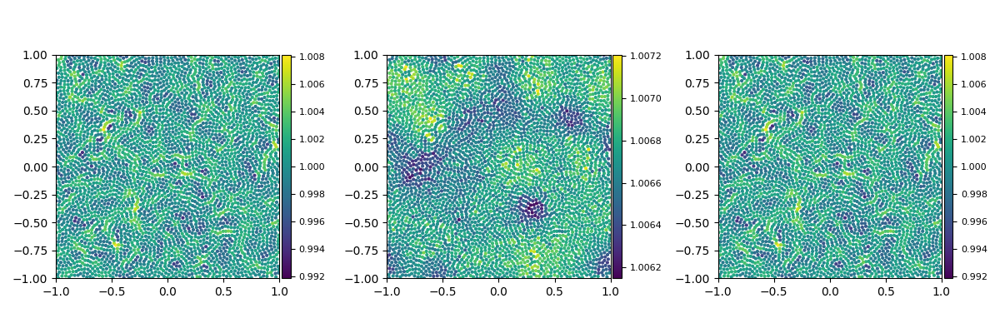

In [ ]:


x = torch.clone(positions)
hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
h = torch.max(hx).item()
area = sphSimulation.simulationState['fluidArea']


i, j, rij, xij, hij = neighborSearch(x, x, h, h, True, True, minDomain, maxDomain)
Kernel = getKernel('Wendland2')

kernel = Kernel.kernel(rij, hij)
gradKernel = Kernel.kernelGradient(rij, xij, hij)


density = sphInterpolation((None,sphSimulation.simulationState['fluidArea']), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (i, j), kernel, gradKernel, x.shape[0])
# density = sphInterpolation((None,area), (None, torch.ones_like(area)), (None, torch.ones_like(area)), (i, j), kernel, gradKernel, x.shape[0])



fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)


visualizeParticles(fig, axis[0,0], 
                   x, area, h, density, 
                   periodicX, periodicY, minDomain, maxDomain, 
                   mapping = '.x', cbar = True, cmap = 'viridis', scaling = 'sym', s = 4, midPoint = 1)
visualizeParticles(fig, axis[0,1], 
                   x, area, h, sphSimulation.simulationState['fluidDensity'], 
                   periodicX, periodicY, minDomain, maxDomain, 
                   mapping = '.y', cbar = True, cmap = 'viridis', scaling = 'lin', s = 4, midPoint = 1)
visualizeParticles(fig, axis[0,2], 
                   x, area, h, density, 
                   periodicX, periodicY, minDomain, maxDomain, 
                   mapping = '.x', cbar = True, cmap = 'viridis', scaling = 'sym', s = 4, midPoint = 1, interpolant = 'SPH')

fig.tight_layout()

In [ ]:
x, area, h = sampleRegular(64, targetNeighbors = 50, correctedArea = True)



# x = torch.clone(positions)
# hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
# h = torch.max(hx).item()

i, j, rij, xij, hij = neighborSearch(x, x, h, h, True, True, minDomain, maxDomain)
Kernel = getKernel('Wendland2')

kernel = Kernel.kernel(rij, hij)
gradKernel = Kernel.kernelGradient(rij, xij, hij)


# density = sphInterpolation((None,sphSimulation.simulationState['fluidArea']), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (i, j), kernel, gradKernel, x.shape[0])
density = sphInterpolation((None,area), (None, torch.ones_like(area)), (None, torch.ones_like(area)), (i, j), kernel, gradKernel, x.shape[0])


fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)

sc = axis[0,0].scatter(x[:,0].detach().cpu().numpy(), x[:,1].detach().cpu().numpy(), s = 4, c = torch.arange(x.shape[0]), cmap = 'twilight')
ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)
axis[0,0].axis('equal')

ii, ni = torch.unique(i, return_counts = True)
padded_ni = torch.zeros(x.shape[0]).to(x.device).type(ii.dtype)
padded_ni[ii] = ni

sc = axis[0,1].scatter(x[:,0].detach().cpu().numpy(), x[:,1].detach().cpu().numpy(), s = 4, c = padded_ni.cpu().numpy(), cmap = 'plasma')
ax1_divider = make_axes_locatable(axis[0,1])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)
axis[0,1].axis('equal')


sc = axis[0,2].scatter(x[:,0].detach().cpu().numpy(), x[:,1].detach().cpu().numpy(), s = 4, c = density.cpu().numpy())
ax1_divider = make_axes_locatable(axis[0,2])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)
axis[0,2].axis('equal')

fig.tight_layout()

print('Area: min %g, max %g, mean %g, stddev %g' %(area.min().item(), area.max().item(), area.mean().item(), area.std().item()))
print('rij: min %g, max %g, mean %g, stddev %g' %(rij.min().item(), rij.max().item(), rij.mean().item(), rij.std().item()))
print('kernel: min %g, max %g, mean %g, stddev %g' %(kernel.min().item(), kernel.max().item(), kernel.mean().item(), kernel.std().item()))
print('Density: min %g, max %g, mean %g, stddev %g' %(density.min().item(), density.max().item(), density.mean().item(), density.std().item()))
print(x.shape)

In [ ]:


density = sphInterpolation((None,sphSimulation.simulationState['fluidArea']), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (None, torch.ones_like(sphSimulation.simulationState['fluidArea'])), (i, j), kernel, gradKernel, x.shape[0])

fig, axis = plt.subplots(1, 2, figsize=(12,6), sharex = False, sharey = False, squeeze = False)

sc = axis[0,0].scatter(x[:,0].detach().cpu().numpy(), x[:,1].detach().cpu().numpy(), s = 1, c = density.cpu().numpy())
ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)

In [ ]:
density

/home/winchenbach/anaconda3/envs/torch2/lib/python3.10/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
NavigationToolbar2WebAgg.__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


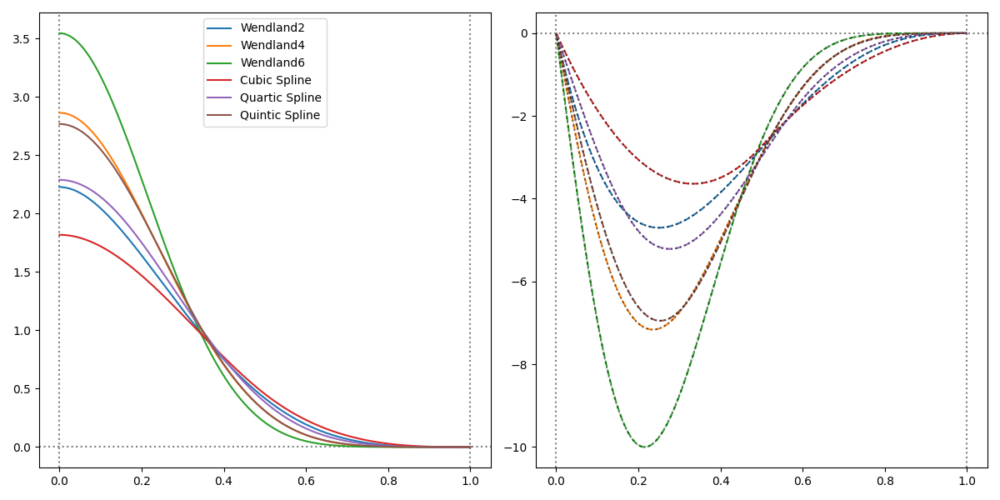

In [ ]:
print(radialDistances.max())
print(hx.max())

In [ ]:
x = torch.clone(positions)
y = torch.clone(positions[:positions.shape[0]//2,:])
# y = torch.clone(positions)
# print(y)
hx = torch.clone(sphSimulation.perennialState['fluidSupport'])
hy = torch.clone(sphSimulation.perennialState['fluidSupport'][:y.shape[0]])


periodicX = True
periodicY = True
minDomain = [-1,-1]
maxDomain = [1,1]

minD = torch.tensor(minDomain).to(x.device).type(x.dtype)
maxD = torch.tensor(maxDomain).to(x.device).type(x.dtype)

i, j, rij, xij, hij = radiusNaive(x, y, hx, hy, periodicX = periodicX, periodicY = periodicY, minDomain = minD, maxDomain = maxD)

neighbors = torch.vstack((i,j))

ii, ni = torch.unique(i, return_counts = True)
padded_ni = torch.zeros_like(hx).type(ii.dtype)
padded_ni[ii] = ni

jj, nj = torch.unique(j, return_counts = True)
padded_nj = torch.zeros_like(hy).type(jj.dtype)
padded_nj[jj] = nj

# display(distanceMatrix < h)
fig, axis = plt.subplots(1, 2, figsize=(12,6), sharex = False, sharey = False, squeeze = False)

sc = axis[0,0].scatter(x[:,0].detach().cpu().numpy(), x[:,1].detach().cpu().numpy(), s = 1, c = padded_ni.cpu().numpy())
ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)

sc = axis[0,1].scatter(y[:,0].detach().cpu().numpy(), y[:,1].detach().cpu().numpy(), s = 1, c = padded_nj.cpu().numpy())
ax1_divider = make_axes_locatable(axis[0,1])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8)

fig.tight_layout()

In [ ]:
ii.max()
jj.max()

In [ ]:
((hx + hy[:,None]) / 2).shape

In [ ]:
hy.repeat(hx.shape[0],1).mT.shape

In [ ]:
config = 'configs/periodicDomain.toml'

with open(config, 'r') as file:
    tomlConfig = file.read()
parsedConfig = tomli.loads(tomlConfig)

simulationModel = deltaSPHSimulation
# simulationModel = dfsphSimulation

sphSimulation = simulationModel(parsedConfig)
sphSimulation.initializeSimulation()
state = sphSimulation.simulationState
state['fluidVelocity'] = 4.0 * state['fluidVelocity'] / torch.max(torch.linalg.norm(state['fluidVelocity'], dim = -1))

# A = 1
# B = -1
# k = np.pi
# state['fluidVelocity'][:,0] =  4 * torch.cos(k * state['fluidPosition'][:,0]) * torch.sin(k * state['fluidPosition'][:,1])
# state['fluidVelocity'][:,1] = -4 * torch.sin(k * state['fluidPosition'][:,0]) * torch.cos(k * state['fluidPosition'][:,1])


sphSimulation.integrate()

from BasisConvolution.twoDimensionalSPH.modules.neighborSearch import periodicNeighborSearchXY
from BasisConvolution.twoDimensionalSPH.kernels import kernel

nx = 128
x = np.linspace(-1,1,nx)
y = np.linspace(-1,1,nx)
# x = np.linspace(0,2*np.pi,nx)
# y = np.linspace(0,2*np.pi,nx)
xx, yy = np.meshgrid(x,y)
pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
print(pos.shape)
i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                            sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                            sphSimulation.config['particle']['support'], 
                                                            sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])


vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')

fig, axis = plt.subplots(1, 6, figsize=(20,4), sharex = False, sharey = False, squeeze = False)
xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()

axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)

axis[0,0].set_xlim(-1,1)
axis[0,0].set_ylim(-1,1)
# axis[0,0].set_xlim(0,2*np.pi)
# axis[0,0].set_ylim(0,2*np.pi)
axis[0,0].set_aspect(1)
axis[0,0].axis('equal')
# fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)


def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'magma')
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

def pMesh2(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'RdBu', vmin = -np.max(np.abs(data)), vmax = np.max(np.abs(data)))
    # sc = axis.pcolormesh(xx,yy,data, cmap = 'icefire', vmin = -2.5, vmax = 2.5)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc
def pMesh3(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'jet', vmin = -np.max(np.abs(data)), vmax = np.max(np.abs(data)))
    # sc = axis.pcolormesh(xx,yy,data, cmap = 'icefire', vmin = -2.5, vmax = 2.5)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
vorticity = np.gradient(yVel)[0] - np.gradient(xVel)[1]
divergence = np.gradient(xVel)[0] - np.gradient(xVel)[1]

pMeshV = pMesh3(fig,axis[0,1], xx, yy, divergence, 'divergence')
pMeshV = pMesh2(fig,axis[0,2], xx, yy, vorticity, 'vorticity')
pMeshX = pMesh2(fig,axis[0,3], xx, yy, xVel, 'x velocity')
pMeshY = pMesh2(fig,axis[0,4], xx, yy, yVel, 'y velocity')
pMeshN = pMesh( fig,axis[0,5], xx, yy, np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), '|velocity|')
    
# axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles']))

fig.tight_layout()

In [ ]:
fig, axis = plt.subplots(1, 1, figsize=(6,6), sharex = False, sharey = False, squeeze = False)
state = sphSimulation.simulationState
axis[0,0].set_xticks([])
axis[0,0].set_yticks([])

positions = state['fluidPosition'].detach().cpu().numpy()
data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
data = state['fluidPressure'].detach().cpu().numpy()
# data = ni.detach().cpu().numpy()

minD = torch.tensor(sphSimulation.config['domain']['min']).cpu().numpy()
maxD = torch.tensor(sphSimulation.config['domain']['max']).cpu().numpy()
y = np.remainder(positions - minD, maxD - minD) + minD

sc = axis[0,0].scatter(y[:,0], y[:,1], c = data, s = 2)
axis[0,0].axis('equal')

ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8) 

fig.suptitle('Generated [%2d:%2d]+[%2d:%2d] res, %2dx%2d noise, %3.2g @ seed %5d' % (sphSimulation.config['generative']['nb'][0],sphSimulation.config['generative']['nb'][1],sphSimulation.config['generative']['nd'][0],sphSimulation.config['generative']['nd'][1], sphSimulation.config['generative']['res'], sphSimulation.config['generative']['octaves'], sphSimulation.config['generative']['persistance'], sphSimulation.config['generative']['seed']))
axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d'%(state['time'], state['timestep'], state['dt'],state['numParticles']))

axis[0,0].set_xlim(-1.1,1.1)
axis[0,0].set_ylim(-1.1,1.1)
axis[0,0].axvline(-1)
axis[0,0].axvline(1)
axis[0,0].axhline(-1)
axis[0,0].axhline(1)


fig.tight_layout()



In [ ]:

nx = 128
x = np.linspace(-1,1,nx)
y = np.linspace(-1,1,nx)
xx, yy = np.meshgrid(x,y)
pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
#     print(pos.shape)
i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                            sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                            sphSimulation.config['particle']['support'], 
                                                            sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])

vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')

fig, axis = plt.subplots(1, 1, figsize=(6,6), sharex = False, sharey = False, squeeze = False)
xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()

axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)

axis[0,0].set_xlim(-1,1)
axis[0,0].set_ylim(-1,1)
axis[0,0].set_aspect(1)
axis[0,0].axis('equal')

In [ ]:
import seaborn as sns

In [ ]:

def updatePlot(sphSimulation, pMeshX, pMeshY, pMeshN, fig, axis):
    nx = 128
    x = np.linspace(-1,1,nx)
    y = np.linspace(-1,1,nx)
    xx, yy = np.meshgrid(x,y)
    pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
#     print(pos.shape)
    i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                                sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                                sphSimulation.config['particle']['support'], 
                                                                sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])

    vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')
    xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
    yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()

    pMeshX.set_array(xVel)
    pMeshY.set_array(yVel)
    pMeshN.set_array(np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2))

    # axis[0,0].cla()
    # axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
    # axis[0,0].set_xlim(-1,1)
    # axis[0,0].set_ylim(-1,1)
    axis[0,0].set_aspect(1)
    
fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = False, sharey = False, squeeze = False)


def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'magma')
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

def pMesh2(fig, axis, xx,yy,data,title):
    # sc = axis.pcolormesh(xx,yy,data, cmap = 'vlag', vmin = -np.max(np.abs(data)), vmax = np.max(np.abs(data)))
    sc = axis.pcolormesh(xx,yy,data, cmap = 'icefire', vmin = -2.5, vmax = 2.5)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
    
pMeshX = pMesh2(fig,axis[0,0], xx, yy, xVel, 'x velocity')
pMeshY = pMesh2(fig,axis[0,1], xx, yy, yVel, 'y velocity')
pMeshN = pMesh(fig,axis[0,2], xx, yy, np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), '|velocity|')
    
# axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles']))
        
fig.tight_layout()

In [ ]:

def updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis):
    nx = 128
    x = np.linspace(-1,1,nx)
    y = np.linspace(-1,1,nx)
    xx, yy = np.meshgrid(x,y)
    pos = torch.tensor(np.stack((xx,yy), axis = 2).reshape(nx * nx, 2), device = sphSimulation.simulationState['fluidPosition'].device, dtype = sphSimulation.simulationState['fluidPosition'].dtype)
#     print(pos.shape)
    i, j, distances, radialDistances = periodicNeighborSearchXY(pos, sphSimulation.simulationState['fluidPosition'], 
                                                                sphSimulation.config['domain']['min'], sphSimulation.config['domain']['max'], 
                                                                sphSimulation.config['particle']['support'], 
                                                                sphSimulation.config['periodicBC']['periodicX'], sphSimulation.config['periodicBC']['periodicY'])

    vel = scatter(sphSimulation.simulationState['fluidVelocity'][i] * (sphSimulation.simulationState['fluidArea'][i] / sphSimulation.simulationState['fluidDensity'][i] * kernel(radialDistances, sphSimulation.config['particle']['support']))[:,None], j, dim = 0, dim_size = nx**2, reduce = 'sum')
    xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
    yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()

    vorticity = np.gradient(yVel)[0] - np.gradient(xVel)[1]

    # pMeshV.set_array(vorticity)
    pMeshX.set_array(xVel)
    pMeshY.set_array(yVel)
    pMeshN.set_array(np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2))

        
    positions = state['fluidPosition'].detach().cpu().numpy()
    data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
    minD = torch.tensor(sphSimulation.config['domain']['min']).cpu().numpy()
    maxD = torch.tensor(sphSimulation.config['domain']['max']).cpu().numpy()
    # y = np.remainder(positions - minD, maxD - minD) + minD
    # sc.set_offsets(np.c_[y[:,0], y[:,1]])
    # sc.set_array(data)

    nu = np.log(data.max()/4) /(-2 * np.pi**2 * sphSimulation.simulationState['time']) / 4
    Re = data.max() * 2 / nu
    fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d, Re: %g'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles'], Re))
    # axis[0,0].cla()
    # axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
    # axis[0,0].set_xlim(-1,1)
    # axis[0,0].set_ylim(-1,1)
    # axis[0,0].set_aspect(1)
    
fig, axis = plt.subplots(1, 3, figsize=(12,4), sharex = True, sharey = True, squeeze = False)


def pMesh(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'magma')
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

def pMesh2(fig, axis, xx,yy,data,title):
    sc = axis.pcolormesh(xx,yy,data, cmap = 'RdBu', vmin = -np.max(np.abs(data)), vmax = np.max(np.abs(data)))
    # sc = axis.pcolormesh(xx,yy,data, cmap = 'icefire', vmin = -2.5, vmax = 2.5)
    axis.axis('equal')

    ax1_divider = make_axes_locatable(axis)
    cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
    cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
    cbar.ax.tick_params(labelsize=8) 
    axis.set_title(title)
    return sc

xVel = vel.reshape(nx,nx,2)[:,:,0].detach().cpu().numpy()
yVel = vel.reshape(nx,nx,2)[:,:,1].detach().cpu().numpy()
vorticity = np.gradient(yVel)[0] - np.gradient(xVel)[1]
state = sphSimulation.simulationState
# pMeshV = pMesh2(fig,axis[0,0], xx, yy, vorticity, 'vorticity')
positions = state['fluidPosition'].detach().cpu().numpy()
data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
minD = torch.tensor(sphSimulation.config['domain']['min']).cpu().numpy()
maxD = torch.tensor(sphSimulation.config['domain']['max']).cpu().numpy()
y = np.remainder(positions - minD, maxD - minD) + minD
# sc = axis[0,0].scatter(y[:,0], y[:,1], c = torch.linalg.norm(sphSimulation.simulationState['fluidVelocity'], dim = -1).cpu().numpy(), s = 1,cmap = 'magma')
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
# axis[0,0].set_box_aspect(1)
# axis[0,0].set_title('Particle |velocity|')

pMeshX = pMesh2(fig,axis[0,0], xx, yy, xVel, 'x velocity')
pMeshY = pMesh2(fig,axis[0,1], xx, yy, yVel, 'y velocity')
pMeshN = pMesh( fig,axis[0,2], xx, yy, np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), '|velocity|')
    
# axis[0,0].streamplot(xx,yy,xVel, yVel,color = np.linalg.norm(vel.reshape(nx,nx,2).detach().cpu().numpy(), axis = 2), density = 2)
# axis[0,0].set_xlim(-1,1)
# axis[0,0].set_ylim(-1,1)
# axis[0,0].set_aspect(1)
# axis[0,0].axis('equal')
nu = np.log(data.max()) /(-2 * np.pi**2 * sphSimulation.simulationState['time']) / 4
Re = data.max() * 2 / nu
fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d, Re: %g'%(sphSimulation.simulationState['time'], sphSimulation.simulationState['timestep'], sphSimulation.simulationState['dt'],sphSimulation.simulationState['numParticles'], Re))
        
fig.tight_layout()

timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
path = '../../images/periodic/%s - %s/' % (config.split('/')[-1].split('.')[0], timestamp)
if not os.path.exists(path):
    os.makedirs(path)
timesteps = 4096 * 4
# timesteps = 2424
for i in tqdm(range(timesteps)):
    sphSimulation.integrate()
#     break
#     sphSimulation.timestep()
    if i  % 64 == 0 or i == timesteps - 1:
#     if True:
        state = sphSimulation.simulationState        

        updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis)
        
        fig.canvas.draw()
        fig.canvas.flush_events()
        
        imagePath = path + '%05d.png' % state['timestep']
        # plt.savefig(imagePath)

In [ ]:
nu = np.log(data.max()) /(-2 * np.pi**2 * sphSimulation.simulationState['time'])

In [ ]:
data.max() * 2 / nu

In [ ]:
np.log(data.max()/4) /(-2) / sphSimulation.simulationState['time']

In [ ]:
timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
path = '../../images/periodic/%s - %s/' % (config.split('/')[-1].split('.')[0], timestamp)
if not os.path.exists(path):
    os.makedirs(path)
timesteps = 4096 * 4
# timesteps = 2424
for i in tqdm(range(timesteps)):
    sphSimulation.integrate()
#     break
#     sphSimulation.timestep()
    if i  % 64 == 0 or i == timesteps - 1:
#     if True:
        state = sphSimulation.simulationState        

        updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis)
        
        fig.canvas.draw()
        fig.canvas.flush_events()
        
        imagePath = path + '%05d.png' % state['timestep']
        # plt.savefig(imagePath)

In [ ]:
timesteps = 4096 * 4
# timesteps = 2424
for i in tqdm(range(timesteps)):
    sphSimulation.integrate()
#     break
#     sphSimulation.timestep()
    if i  % 64 == 0 or i == timesteps - 1:
#     if True:
        state = sphSimulation.simulationState        

        updatePlot(sphSimulation, sc, pMeshX, pMeshY, pMeshN, pMeshV, fig, axis)
        
        fig.canvas.draw()
        fig.canvas.flush_events()
        
        imagePath = path + '%05d.png' % state['timestep']
        # plt.savefig(imagePath)

In [ ]:
sphSimulation.simulationState['fluidNeighbors'], sphSimulation.simulationState['fluidDistances'], sphSimulation.simulationState['fluidRadialDistances'] = sphSimulation.neighborSearch.search(sphSimulation.simulationState, sphSimulation)
sphSimulation.boundaryModule.boundaryFilterNeighborhoods(sphSimulation.simulationState, sphSimulation)
sphSimulation.boundaryModule.boundaryNeighborhoodSearch(sphSimulation.simulationState, sphSimulation)

sphSimulation.sphDensity.evaluate(sphSimulation.simulationState, sphSimulation)    
sphSimulation.boundaryModule.evalBoundaryDensity(sphSimulation.simulationState, sphSimulation) 
sphSimulation.simulationState['fluidAcceleration'] = torch.zeros_like(sphSimulation.simulationState['fluidVelocity'])   
sphSimulation.gravityModule.evaluate(sphSimulation.simulationState, sphSimulation)
sphSimulation.simulationState['densityIterations'] = sphSimulation.DFSPH.incompressibleSolver(sphSimulation.simulationState, sphSimulation)
sphSimulation.simulationState['fluidAcceleration'] += sphSimulation.simulationState['fluidPredAccel']
sphSimulation.velocityDiffusionModule.evaluate(sphSimulation.simulationState, sphSimulation)    

fig, axis = plt.subplots(1, 1, figsize=(12,12), sharex = False, sharey = False, squeeze = False)
state = sphSimulation.simulationState
axis[0,0].set_xticks([])
axis[0,0].set_yticks([])

positions = state['fluidPosition'].detach().cpu().numpy()
data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
data = state['fluidDensity'].detach().cpu().numpy()

sc = axis[0,0].scatter(positions[:,0], positions[:,1], c = data, s = 4)
axis[0,0].axis('equal')

ax1_divider = make_axes_locatable(axis[0,0])
cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
cbar.ax.tick_params(labelsize=8) 

fig.suptitle('Generated [%2d:%2d]+[%2d:%2d] res, %2dx%2d noise, %3.2g @ seed %5d' % (sphSimulation.config['generative']['nb'][0],sphSimulation.config['generative']['nb'][1],sphSimulation.config['generative']['nd'][0],sphSimulation.config['generative']['nd'][1], sphSimulation.config['generative']['res'], sphSimulation.config['generative']['octaves'], sphSimulation.config['generative']['persistance'], sphSimulation.config['generative']['seed']))
axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles']))

axis[0,0].set_xlim(-1,1)
axis[0,0].set_ylim(-1,1)

fig.tight_layout()


In [ ]:
# print(sphSimulation.config['fluid'])

In [ ]:
# timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
# path = './outputCollision/%s - %s/' % (config.split('/')[-1].split('.')[0], timestamp)
# if not os.path.exists(path):
#     os.makedirs(path)

In [ ]:
timesteps = 128
# timesteps = 2424
for i in tqdm(range(timesteps)):
    sphSimulation.integrate()
#     break
#     sphSimulation.timestep()
    if i  % 1 == 0 or i == timesteps - 1:
#     if True:
        state = sphSimulation.simulationState
        positions = state['fluidPosition'].detach().cpu().numpy()

#         positions2 = sphSimulation.boundaryModule.boundaryPositions.detach().cpu().numpy()
        
        data = state['fluidDensity'].detach().cpu().numpy()
#         data2 = sphSimulation.boundaryModule.boundaryDensity.detach().cpu().numpy() * 0
        
#         data2 = torch.linalg.norm(sphSimulation.boundaryModule.boundaryVelocity, dim=1).detach().cpu().numpy()
        data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()
#         data = torch.linalg.norm(state['fluidUpdate'], dim=1).detach().cpu().numpy()
        
#         data = state['fluidPressure'].detach().cpu().numpy()
#         data = sphSimulation.deltaSPH.pressure.detach().cpu().numpy()
#         data2 = sphSimulation.boundaryModule.boundaryPressure.detach().cpu().numpy()

#         positions = np.vstack((positions, positions2))
#         data = np.hstack((data, data2))

        cbar.mappable.set_clim(vmin=np.min(data), vmax=np.max(data))
        sc.set_offsets(positions)
        sc.set_array(data)


        axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles']))
        if 'densityErrors' in state and not 'divergenceErrors' in state:
            axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d]'%(state['time'], state['timestep'], state['dt'], state['numParticles'],state['realParticles'],len(state['densityErrors'])))
        if 'divergenceErrors' in state and not 'densityErrors' in state:
            axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles'],len(state['divergenceErrors'])))
        if 'densityErrors' in state and 'divergenceErrors' in state:
            axis[0,0].set_title('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d, %3d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles'],len(state['densityErrors']),len(state['divergenceErrors'])))

        
        fig.canvas.draw()
        fig.canvas.flush_events()
        
#         imagePath = path + '%05d.png' % state['timestep']
#         plt.savefig(imagePath)

In [ ]:
from BasisConvolution.modules.densityDiffusion import computeNormalizationMatrix
from BasisConvolution.kernels import kernel, spikyGrad, kernelGradient
simulationState = sphSimulation.simulationState
normalizationMatrix = computeNormalizationMatrix(simulationState['fluidNeighbors'][0], simulationState['fluidNeighbors'][1], \
                                                                                                  simulationState['fluidPosition'], simulationState['fluidPosition'], simulationState['fluidVolume'], simulationState['fluidVolume'],\
                                                                                                  simulationState['fluidDistances'], simulationState['fluidRadialDistances'],\
                                                                                                  sphSimulation.densityDiffusionModule.support, simulationState['fluidDensity'].shape[0], sphSimulation.densityDiffusionModule.eps)     
normalizationMatrix += sphSimulation.boundaryModule.computeNormalizationMatrices(simulationState, sphSimulation)
ni = simulationState['fluidNeighbors'][0]

In [ ]:
def gj_solve(m=[1., 0.], n=3, nb=1, result=[0.0, 0.0]):
    r"""A gauss-jordan method to solve an augmented matrix.
    The routine is given the augmented matrix, the number of rows/cols in the
    original matrix and the number of added columns. The result is stored in
    the result array passed.
    Parameters
    ----------
    m : list: a flattened list representing the augmented matrix [A|b].
    n : int: number of columns/rows used from A in augmented_matrix.
    nb: int: number of columns added to A.
    result: list: with size n*nb
    References
    ----------
    https://ricardianambivalence.com/2012/10/20/pure-python-gauss-jordan
    -solve-ax-b-invert-a/
    """

    i, j, eqns, colrange, augCol, col, row, bigrow, nt = 0,0,0,0,0,0,0,0,0
    eqns = n
    colrange = n
    augCol = n + nb
    nt = n + nb

    for col in range(colrange):
        bigrow = col
        for row in range(col + 1, colrange):
            if abs(m[nt*row + col]) > abs(m[nt*bigrow + col]):
                bigrow = row
                temp = m[nt*row + col]
                m[nt*row + col] = m[nt*bigrow + col]
                m[nt*bigrow + col] = temp
    print(m.reshape(4,3))
    rr, rrcol, rb, rbr, kup, kupr, kleft, kleftr = 0,0,0,0,0,0,0,0
    for rrcol in range(0, colrange):
        for rr in range(rrcol + 1, eqns):
            dnr = float(m[nt*rrcol + rrcol])
            if abs(dnr) < 1e-12:
                return 1.0
            cc = -float(m[nt*rr + rrcol]) / dnr
            for j in range(augCol):
                m[nt*rr + j] = m[nt*rr + j] + cc * m[nt*rrcol + j]
    print(m.reshape(4,3))

    backCol, backColr = 0,0
    tol = 1.0e-12
    for rbr in range(eqns):
        rb = eqns - rbr - 1
        if (m[nt*rb + rb] == 0):
            if abs(m[nt*rb + augCol - 1]) > tol:
                # Error, singular matrix.
                return 1.0
        else:
            for backColr in range(rb, augCol):
                backCol = rb + augCol - backColr - 1
                m[nt*rb + backCol] = m[nt*rb + backCol] / m[nt*rb + rb]
            if not (rb == 0):
                for kupr in range(rb):
                    kup = rb - kupr - 1
                    for kleftr in range(rb, augCol):
                        kleft = rb + augCol - kleftr - 1
                        kk = -m[nt*kup + rb] / m[nt*rb + rb]
                        m[nt*kup + kleft] = (m[nt*kup + kleft] +
                                             kk * m[nt*rb + kleft])
    print(m.reshape(4,3))

    for i in range(n):
        for j in range(nb):
            result[nb*i + j] = m[nt*i + n + j]

    return 0.0

In [ ]:
normalizationMatrix.shape
expanded = torch.zeros((normalizationMatrix.shape[0],3,3))
expanded[:,:2,:2] = normalizationMatrix
n = 2
nt = n + 1
expanded = expanded.reshape(normalizationMatrix.shape[0],9)[ni,:]
print(expanded.shape)
gradW = kernelGradient(simulationState['fluidRadialDistances'], simulationState['fluidDistances'], sphSimulation.densityDiffusionModule.support)


temp = torch.zeros((ni.shape[0], 12))
res  = torch.zeros((ni.shape[0], 3))
for i in range(n):
    for j in range(n):
        temp[:,nt * i + j] = expanded[:,3 * i + j]
#         print(expanded[:,3 * i + j].shape)
    temp[:, nt*i + n] = gradW[:,i]
print(temp.reshape(ni.shape[0],4,3))
print(normalizationMatrix[ni])

In [ ]:
batch_gj_solve(temp, n, 1, res)

In [ ]:
normalizationMatrix.shape
expanded = torch.zeros((normalizationMatrix.shape[0],3,3))
expanded[:,:2,:2] = normalizationMatrix
n = 2
nt = n + 1
expanded = expanded.reshape(normalizationMatrix.shape[0],9)[ni,:]
print(expanded.shape)
gradW = kernelGradient(simulationState['fluidRadialDistances'], simulationState['fluidDistances'], sphSimulation.densityDiffusionModule.support)


temp = torch.zeros((ni.shape[0], 12))
res  = torch.zeros((ni.shape[0], 3))
for i in range(n):
    for j in range(n):
        temp[:,nt * i + j] = expanded[:,3 * i + j]
#         print(expanded[:,3 * i + j].shape)
    temp[:, nt*i + n] = gradW[:,i]
# print(temp.reshape(ni.shape[0],4,3))
# print(normalizationMatrix[ni])

gj_solve(temp[1], n, 1, res[1])
print(temp[1].reshape(4,3))
print(res[1])

In [ ]:
normalizationMatrix.device

In [ ]:
gradW = kernelGradient(simulationState['fluidRadialDistances'], simulationState['fluidDistances'], sphSimulation.densityDiffusionModule.support)    
normalizedGradients = invertNormalizationMatrix_GJ(normalizationMatrix, gradW, ni)

In [ ]:
gradW = kernelGradient(simulationState['fluidRadialDistances'], simulationState['fluidDistances'], sphSimulation.densityDiffusionModule.support)    
normalizedGradients = invertNormalizationMatrix_PINV(normalizationMatrix, gradW, ni)

In [ ]:
dwij_mag = torch.linalg.norm(gradW, axis = 1, ord = 1)
norm_mag = torch.linalg.norm(normalizedGradients, axis = 1, ord = 1)

eps = 1e-4 * sphSimulation.densityDiffusionModule.support
tol = 0.1
change = abs(norm_mag - dwij_mag) / (dwij_mag + eps)
normalizedGradients = torch.where((change < tol)[:,None], normalizedGradients, gradW)

# print(change)

In [ ]:
print(m[1].reshape(4,3))
print(res[1])

In [ ]:
print(temp[1].reshape(4,3))
print(res[1])

In [ ]:
pinv = torch.linalg.pinv(normalizationMatrix[0])
print(normalizationMatrix[0])
print(pinv)
print(pinv * normalizationMatrix[0])
print(gradW[1])
print(torch.mv(pinv, gradW[1]))


In [ ]:
# debugPrint(sphSimulation.config['particle']['support'])
# debugPrint(sphSimulation.simulationState['fluidSupport'])

In [ ]:
sphSimulation.outFile.close()
# debugPrint(sphSimulation.outFile.keys())

In [ ]:
# fig, axis = sphSimulation.createPlot(plotScale = 2, plotSolids = False, plotDomain = False)
# state = sphSimulation.simulationState

# positions = state['fluidPosition'].detach().cpu().numpy()
# data = state['fluidDensity'].detach().cpu().numpy()

# positions2 = sphSimulation.boundaryModule.boundaryPositions.detach().cpu().numpy()
# data2 = sphSimulation.boundaryModule.boundaryPressure.detach().cpu().numpy()

# # data2 = torch.linalg.norm(sphSimulation.boundaryModule.boundaryVelocity, dim=1).detach().cpu().numpy()
# # data = torch.linalg.norm(state['fluidVelocity'], dim=1).detach().cpu().numpy()

# # positions = np.vstack((positions, positions2))
# # data = np.hstack((data, data2))

# # data = sphSimulation.DFSPH.fluidAlpha
# data = state['fluidPressure']

# # positions = positions2
# # data = data2

# sc = axis[0,0].scatter(positions[:,0], positions[:,1], c = data, s = 2)
# axis[0,0].axis('equal')

# ax1_divider = make_axes_locatable(axis[0,0])
# cax1 = ax1_divider.append_axes("right", size="4%", pad="1%")
# cbar = fig.colorbar(sc, cax=cax1,orientation='vertical')
# cbar.ax.tick_params(labelsize=8) 

# # quiverData = state['fluidUpdate'].detach().cpu().numpy()
# # qv = axis[0,0].quiver(positions[:,0], positions[:,1], quiverData[:,0], quiverData[:,1], \
# #                       scale_units='xy', scale = 0.1) #scale = 2/ sphSimulation.config['particle']['support'], alpha=0.5)

# fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles']))
# if 'densityErrors' in state and not 'divergenceErrors' in state:
#     fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d]'%(state['time'], state['timestep'], state['dt'], state['numParticles'],state['realParticles'],len(state['densityErrors'])))
# if 'divergenceErrors' in state and not 'densityErrors' in state:
#     fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles'],len(state['divergenceErrors'])))
# if 'densityErrors' in state and 'divergenceErrors' in state:
#     fig.suptitle('t=%2.4f[%4d] @ dt = %1.5fs, ptcls: %5d[%5d], dfsph: [%3d, %3d]'%(state['time'], state['timestep'], state['dt'],state['numParticles'],state['realParticles'],len(state['densityErrors']),len(state['divergenceErrors'])))

# fig.tight_layout()



In [ ]:
with profile(activities=[ProfilerActivity.CPU, ProfilerActivity.CUDA],with_stack=False, profile_memory=True) as prof:    
    for i in range(1):
        with record_function("full Timestep"): 
            sphSimulation.integrate()
        
# print(prof.key_averages().table(sort_by='self_cpu_time_total'))
print(prof.key_averages().table(sort_by='cpu_time_total'))

prof.export_chrome_trace("traceGPU.json")